#Problem Statement:

The client needs a more effective method to simulate the characteristics of asset returns for better long-term projections. The traditional approach using a log-normal distribution on daily data and then annualizing it has proven inadequate, particularly failing to capture crucial tail and trending behaviors, and variations across different asset classes.



# Preparing the data

In [ ]:
# Importing libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [ ]:
SnP = pd.read_csv('/content/CRSP_S&P_returns_monthly.csv')
Eu = pd.read_csv('/content/MSCI Europe.csv')

In [ ]:
#Retaining only 2 columns from the SnP data
#caldt : Closing date of the month
#spindx : closing index value for the month

SnP = SnP[['caldt','spindx']]
SnP = SnP.rename(columns = {'caldt': 'Date', 'spindx': 'IndexVal'})

SnP['Index'] = 'SnP'
SnP

,Date,IndexVal,Index
0,1925-12-31,12.46,SnP
1,1926-01-30,12.74,SnP
2,1926-02-27,12.18,SnP
3,1926-03-31,11.46,SnP
4,1926-04-30,11.72,SnP
...,...,...,...
1172,2023-08-31,4507.66,SnP
1173,2023-09-29,4288.05,SnP
1174,2023-10-31,4193.80,SnP
1175,2023-11-30,4567.80,SnP


In [ ]:
#Renaming colums in the Eu Data to match the SnP data
Eu = Eu.rename(columns = {'MSCI Europe': 'IndexVal'})
Eu['Index'] = 'EU'
Eu

,Date,IndexVal,Index
0,1978-12,10000.000000,EU
1,1979-01,10044.713946,EU
2,1979-02,10224.262076,EU
3,1979-03,10879.278115,EU
4,1979-04,11025.247513,EU
...,...,...,...
538,2023-10,447984.929958,EU
539,2023-11,492198.137592,EU
540,2023-12,516786.019247,EU
541,2024-01,516181.429000,EU


In [ ]:
#Removing the Date part of the Date in SnP, as our analysis is on Monthly returns

SnP['Date'] = pd.to_datetime(SnP['Date']).dt.strftime('%Y-%m')
SnP.head()

,Date,IndexVal,Index
0,1925-12,12.46,SnP
1,1926-01,12.74,SnP
2,1926-02,12.18,SnP
3,1926-03,11.46,SnP
4,1926-04,11.72,SnP


## Derived Columns

Calculating Returns and log returns

In [ ]:
# For SnP data

SnP = SnP.sort_values('Date')
# Monthly returns in decimal form
SnP['Return'] = (SnP['IndexVal'] / SnP['IndexVal'].shift(1) - 1)
# Log returns
SnP['Log Return'] = np.log(SnP['IndexVal'] / SnP['IndexVal'].shift(1))
SnP.head()

,Date,IndexVal,Index,Return,Log Return
0,1925-12,12.46,SnP,NaN,NaN
1,1926-01,12.74,SnP,0.022472,0.022223
2,1926-02,12.18,SnP,-0.043956,-0.044951
3,1926-03,11.46,SnP,-0.059113,-0.060933
4,1926-04,11.72,SnP,0.022688,0.022434


In [ ]:
#For Eu data

Eu = Eu.sort_values('Date')
# Monthly returns in decimal form
Eu['Return'] = (Eu['IndexVal'] / Eu['IndexVal'].shift(1) - 1)
# Log returns
Eu['Log Return'] = np.log(Eu['IndexVal'] / Eu['IndexVal'].shift(1))
Eu.head()

,Date,IndexVal,Index,Return,Log Return
0,1978-12,10000.000000,EU,NaN,NaN
1,1979-01,10044.713946,EU,0.004471,0.004461
2,1979-02,10224.262076,EU,0.017875,0.017717
3,1979-03,10879.278115,EU,0.064065,0.062096
4,1979-04,11025.247513,EU,0.013417,0.013328


Merging SnP and EU data to get a combines data frame for EDA

In [ ]:
# Dropping the first row of each DataFrame by index

SnP = SnP[SnP['Date'] != '1925-12']
Eu = Eu[Eu['Date'] != '1978-12']

In [ ]:
df = pd.merge(SnP, Eu, how='inner', on='Date', suffixes=('_SnP', '_Eu'))
df

,Date,IndexVal_SnP,Index_SnP,Return_SnP,Log Return_SnP,IndexVal_Eu,Index_Eu,Return_Eu,Log Return_Eu
0,1979-01,99.93,SnP,0.039746,0.038977,10044.713946,EU,0.004471,0.004461
1,1979-02,96.28,SnP,-0.036526,-0.037209,10224.262076,EU,0.017875,0.017717
2,1979-03,101.59,SnP,0.055152,0.053684,10879.278115,EU,0.064065,0.062096
3,1979-04,101.76,SnP,0.001673,0.001672,11025.247513,EU,0.013417,0.013328
4,1979-05,99.08,SnP,-0.026336,-0.026689,10469.467587,EU,-0.050410,-0.051725
...,...,...,...,...,...,...,...,...,...
535,2023-08,4507.66,SnP,-0.017716,-0.017875,484619.441047,EU,-0.039670,-0.040479
536,2023-09,4288.05,SnP,-0.048719,-0.049946,465362.673375,EU,-0.039736,-0.040547
537,2023-10,4193.80,SnP,-0.021980,-0.022225,447984.929958,EU,-0.037342,-0.038057
538,2023-11,4567.80,SnP,0.089179,0.085424,492198.137592,EU,0.098694,0.094122


# Exploratory Data Analytics

## Summary Statistics

In [ ]:
print(df.describe())
print(df.info())

       IndexVal_SnP  Return_SnP  Log Return_SnP    IndexVal_Eu   Return_Eu  \
count    540.000000  540.000000      540.000000     540.000000  540.000000   
mean    1247.015204    0.008232        0.007231  182815.261420    0.008623   
std     1125.278132    0.043901        0.044287  142282.031997    0.050535   
min       96.280000   -0.217630       -0.245428    9772.103113   -0.212446   
25%      340.255000   -0.017430       -0.017583   53336.929681   -0.019661   
50%     1083.165000    0.011553        0.011487  169741.928412    0.011823   
75%     1506.182500    0.035996        0.035364  303830.989938    0.041162   
max     4769.830000    0.131767        0.123780  516786.019247    0.170133   

       Log Return_Eu  
count     540.000000  
mean        0.007306  
std         0.050950  
min        -0.238823  
25%        -0.019857  
50%         0.011754  
75%         0.040337  
max         0.157118  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 540 entries, 0 to 539
Data columns (tota

## Missing Data

In [ ]:
print(df.isnull().sum())
#The null vales for IndexVal_Eu, Index_Eu, Return_Eu, Log Return_Eu are expected given the SnP data is more backdated

Date              0
IndexVal_SnP      0
Index_SnP         0
Return_SnP        0
Log Return_SnP    0
IndexVal_Eu       0
Index_Eu          0
Return_Eu         0
Log Return_Eu     0
dtype: int64


## Visualization of Trends Over Time

We visualize the log returns over time to get familiar with our main data set. We observe how closely both indices tend to move together, and how both indices have shared major shocks together like in 2008 or 2020.




In [ ]:
import plotly.graph_objects as go


# Create a figure with plotly.graph_objects
fig = go.Figure()

# Add traces for SnP and EU log returns with specific colors
fig.add_trace(go.Scatter(x=df['Date'], y=df['Log Return_SnP'], mode='lines', name='SnP',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=df['Date'], y=df['Log Return_Eu'], mode='lines', name='EU',
                         line=dict(color='orange')))

# Set the title and axis labels
fig.update_layout(
    title='Log Returns Trends Over Time',
    xaxis_title='Date',
    yaxis_title='Log Returns',
    hovermode='x unified'  # Shows the hover information for all traces at the closest x position
)

# Show the plot
fig.show()


##  Calculate Monthly Realized Volatility

Realized volatility is typically calculated as the standard deviation of daily returns over a certain period, often annualized. For monthly data, we would adjust the annualization factor accordingly. the annualized monthly volatility can be calculated as:

Annualized Monthly Volatility=Standard Deviation of Monthly Log Returns×
sqrt(12)
​


In [ ]:
# Calculate rolling standard deviation of the log returns
df['Volatility_SnP'] = df['Log Return_SnP'].rolling(window=12).std() * (12 ** 0.5)
df['Volatility_Eu'] = df['Log Return_Eu'].rolling(window=12).std() * (12 ** 0.5)

The rolling().std() calculation will produce NaN for the first 11 months because there isn't enough data to calculate a 12-month standard deviation until the 12th month. This is normal behavior for rolling calculations.

In [ ]:
df

,Date,IndexVal_SnP,Index_SnP,Return_SnP,Log Return_SnP,IndexVal_Eu,Index_Eu,Return_Eu,Log Return_Eu,Volatility_SnP,Volatility_Eu
0,1979-01,99.93,SnP,0.039746,0.038977,10044.713946,EU,0.004471,0.004461,NaN,NaN
1,1979-02,96.28,SnP,-0.036526,-0.037209,10224.262076,EU,0.017875,0.017717,NaN,NaN
2,1979-03,101.59,SnP,0.055152,0.053684,10879.278115,EU,0.064065,0.062096,NaN,NaN
3,1979-04,101.76,SnP,0.001673,0.001672,11025.247513,EU,0.013417,0.013328,NaN,NaN
4,1979-05,99.08,SnP,-0.026336,-0.026689,10469.467587,EU,-0.050410,-0.051725,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
535,2023-08,4507.66,SnP,-0.017716,-0.017875,484619.441047,EU,-0.039670,-0.040479,0.185126,0.205607
536,2023-09,4288.05,SnP,-0.048719,-0.049946,465362.673375,EU,-0.039736,-0.040547,0.158591,0.181508
537,2023-10,4193.80,SnP,-0.021980,-0.022225,447984.929958,EU,-0.037342,-0.038057,0.146901,0.182196
538,2023-11,4567.80,SnP,0.089179,0.085424,492198.137592,EU,0.098694,0.094122,0.161154,0.174899


The annualized volatility graph shows how volatility of returns varies over time. We observe that the not only the returns move together but also the volatility of both indices. Additionally, we observe that the European index tends to have a larger annualized volatility compared to the S&P 500.

In [ ]:
# Create a figure with plotly.graph_objects
fig = go.Figure()

# Add traces for SnP and EU realized volatility with specific colors
fig.add_trace(go.Scatter(x=df['Date'], y=df['Volatility_SnP'], mode='lines', name='SnP Volatility',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=df['Date'], y=df['Volatility_Eu'], mode='lines', name='EU Volatility',
                         line=dict(color='orange')))

# Set the title and axis labels
fig.update_layout(
    title='Annualized Monthly Volatility',
    xaxis_title='Date',
    yaxis_title='Volatility',
    hovermode='x unified'
)

# Show the plot
fig.show()


## Value at Risk (VaR)

Value at Risk (VaR) is a measure used to assess the risk of investment. It estimates how much a set of investments might lose, given normal market conditions, over a set time period at a given confidence level.

For a non-parametric approach, such as Historical VaR, we would determine the VaR by looking at historical returns and finding the return level that corresponds to the desired confidence level. Here’s a simplified explanation on how to calculate the Historical VaR at a 95% confidence level for each group of returns (SnP and EU)

In [ ]:
# Calculating the historical VaR

# For SnP
VaR_95_SnP = df['Return_SnP'].quantile(0.05)

# For EU
VaR_95_Eu = df['Return_Eu'].quantile(0.05)


In [ ]:
print(f"95% VaR for SnP Index: {VaR_95_SnP}")
print(f"95% VaR for EU Index: {VaR_95_Eu}")


95% VaR for SnP Index: -0.06884651203501226
95% VaR for EU Index: -0.08136070306611738


In [ ]:
import plotly.graph_objects as go

# Create a figure with plotly.graph_objects
fig = go.Figure()

# Add traces for SnP and EU returns
fig.add_trace(go.Scatter(x=df['Date'], y=df['Return_SnP'], mode='lines', name='SnP Returns', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=df['Date'], y=df['Return_Eu'], mode='lines', name='EU Returns', line=dict(color='orange')))

# Add horizontal lines for VaR
fig.add_hline(y=VaR_95_SnP, line_dash="dash", line_color="blue", annotation_text="95% VaR SnP", annotation_position="top right")
fig.add_hline(y=VaR_95_Eu, line_dash="dash", line_color="orange", annotation_text="95% VaR EU", annotation_position="bottom right")

# Set the title and axis labels
fig.update_layout(
    title='Historical Returns and VaR',
    xaxis_title='Date',
    yaxis_title='Returns',
    hovermode='x unified'
)

# Show the plot
fig.show()


The lines for SnP and EU returns show the return values over time.
The dashed horizontal lines represent the 95% VaR for each index. These lines are at the fixed level where you expect 95% of the historical monthly returns to be above this value.


# Predictive Analytics

In [ ]:
#Combining the original data through inner join for ML
df1 = pd.merge(SnP, Eu, how='inner', on='Date', suffixes=('_SnP', '_Eu'))
df1.head()

,Date,IndexVal_SnP,Index_SnP,Return_SnP,Log Return_SnP,IndexVal_Eu,Index_Eu,Return_Eu,Log Return_Eu
0,1979-01,99.93,SnP,0.039746,0.038977,10044.713946,EU,0.004471,0.004461
1,1979-02,96.28,SnP,-0.036526,-0.037209,10224.262076,EU,0.017875,0.017717
2,1979-03,101.59,SnP,0.055152,0.053684,10879.278115,EU,0.064065,0.062096
3,1979-04,101.76,SnP,0.001673,0.001672,11025.247513,EU,0.013417,0.013328
4,1979-05,99.08,SnP,-0.026336,-0.026689,10469.467587,EU,-0.050410,-0.051725


# Parameter to determine regime changes

Indicator variables for financial regimes are valuable because they simplify complex market conditions. By separating periods of high volatility from low volatility, or high correlation from low correlation, these indicators help us understand how financial markets behave under different circumstances. This knowledge is crucial for investors to make informed decisions and develop appropriate risk management strategies depending on the prevailing regime.

In [ ]:
# Volatility Regime definition

# Define a threshold for high volatility (can be adjusted based on your needs)
volatility_threshold_SnP = df['Volatility_SnP'].std() * 2  # 2 standard deviations above the mean
volatility_threshold_Eu = df['Volatility_Eu'].std() * 2  # 2 standard deviations above the mean


# Create a new column for volatility indicator (0 for low, 1 for high)
df['Volatility_Indicator_SnP'] = np.where(df['Volatility_SnP'] > volatility_threshold_SnP, 1, 0)
df['Volatility_Indicator_Eu'] = np.where(df['Volatility_Eu'] > volatility_threshold_Eu, 1, 0)




In [ ]:
# Create a figure with plotly.graph_objects
fig = go.Figure()

# Add traces for SnP and EU realized volatility with specific colors
fig.add_trace(go.Scatter(x=df['Date'], y=df['Volatility_SnP'], mode='lines', name='SnP Volatility',
                         line=dict(color='blue')))
fig.add_trace(go.Scatter(x=df['Date'], y=df['Volatility_Indicator_SnP'], mode='lines', name='Volatility Indicator SnP',
                         line=dict(color='red')))


# Set the title and axis labels
fig.update_layout(
    title='Annualized Monthly Volatility Regimes S&P',
    xaxis_title='Date',
    yaxis_title='Volatility',
    hovermode='x unified'
)

# Show the plot
fig.show()

In [ ]:
# Create a figure with plotly.graph_objects
fig = go.Figure()

# Add traces for SnP and EU realized volatility with specific colors
fig.add_trace(go.Scatter(x=df['Date'], y=df['Volatility_Eu'], mode='lines', name='Eu Volatility',
                         line=dict(color='orange')))
fig.add_trace(go.Scatter(x=df['Date'], y=df['Volatility_Indicator_Eu'], mode='lines', name='Volatility Indicator EU',
                         line=dict(color='red')))


# Set the title and axis labels
fig.update_layout(
    title='Annualized Monthly Volatility Regimes EU',
    xaxis_title='Date',
    yaxis_title='Volatility',
    hovermode='x unified'
)

# Show the plot
fig.show()

The correlation graph shows how returns between the S&P 500 and the MSCI Europe move together or apart over time. We observe that both indices have a high correlations in the range of 60% - 80%. Outlier events occured around 1994 and 2017 where the correleation between both markets became negative for short periods. Generally, we observe that the correlation increased over recent years to a level around 80% which is most likely stemming from increased globalization.

In [ ]:
# Calculating the rolling Correlation between the S&P 500 and MSCI Europe for 12
# Convert 'Date' column to datetime if it's not already
df['Date'] = pd.to_datetime(df['Date'])

# Now calculate the rolling correlation using a 12-month window
df['Rolling_corr'] = df['Log Return_SnP'].rolling(window=12).corr(df['Log Return_Eu'])


# Assuming 'Date' is your date column (adjust if different)
start_date = pd.to_datetime('1979-01-01')  # Convert to datetime format
end_date = pd.to_datetime('2024-04-18')  # You can adjust the end date

# Subset the DataFrame based on dates
df_subset = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

# Create a figure with plotly.graph_objects
fig = go.Figure()

# Add traces for SnP and EU realized volatility with specific colors
fig.add_trace(go.Scatter(x=df_subset['Date'], y=df_subset['Rolling_corr'], mode='lines', name='12 Month Correlation',
                         line=dict(color='red')))


# Set the title and axis labels
fig.update_layout(
    title='Rolling Correlation',
    xaxis_title='Date',
    yaxis_title='Correlation',
    hovermode='x unified'
)

# Show the plot
fig.show()


The Quantile-Quantile (QQ) plots are used to test if the log returns we have are distributed normally. When analyzing the plots, we observe that the main body of our returns is normally distributed as the quantile points line up accordingly. However, the left tail is fattert than what a normal distribution would expect which is a critical part as we this tail represents extreme losses. As this is the case for both indices, we decide to simulate futur returns with a non-normal student-t distribution that accounts for more extreme events.

<Figure size 640x480 with 0 Axes>

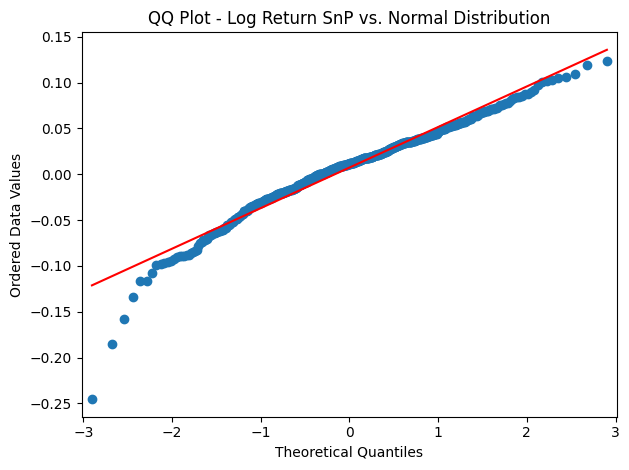

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot

plt.figure()
# QQ plot for first data set (SnP return)
qqplot(df['Log Return_SnP'], fit=False, line='s')  # 's' for straight reference line
plt.title('QQ Plot - Log Return SnP vs. Normal Distribution')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Ordered Data Values')
plt.tight_layout()
plt.show()  # Show the first QQ plot


<Figure size 640x480 with 0 Axes>

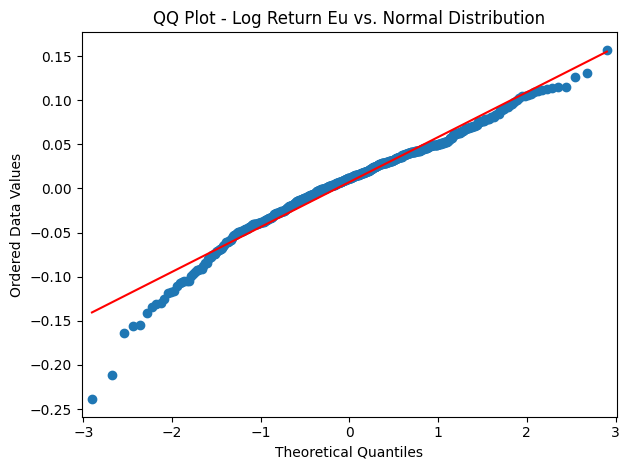

In [ ]:
# Create a new figure for the second plot
plt.figure()  # Create a new figure

# QQ plot for second data set (Eu return)
qqplot(df['Log Return_Eu'], fit=False, line='s')
plt.title('QQ Plot - Log Return Eu vs. Normal Distribution')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Ordered Data Values')
plt.tight_layout()
plt.show()  # Show the second QQ plot

The codes below generate histograms for the log returns of two datasets, presumably representing two different financial indices or assets. A histogram is a graphical representation of the distribution of numerical data. In this case, it visualizes the frequency distribution of log returns. This is particularly useful in finance to assess the distribution and volatility of returns. By using histograms, analysts can quickly identify the central tendencies and the spread of the data. For instance, if the histogram of log returns shows a normal distribution, it can suggest that the returns do not exhibit significant skewness or kurtosis, which are measures of asymmetry and tail weight, respectively. On the other hand, deviations from a normal distribution can imply potential risks or opportunities for further analysis or investment strategies.

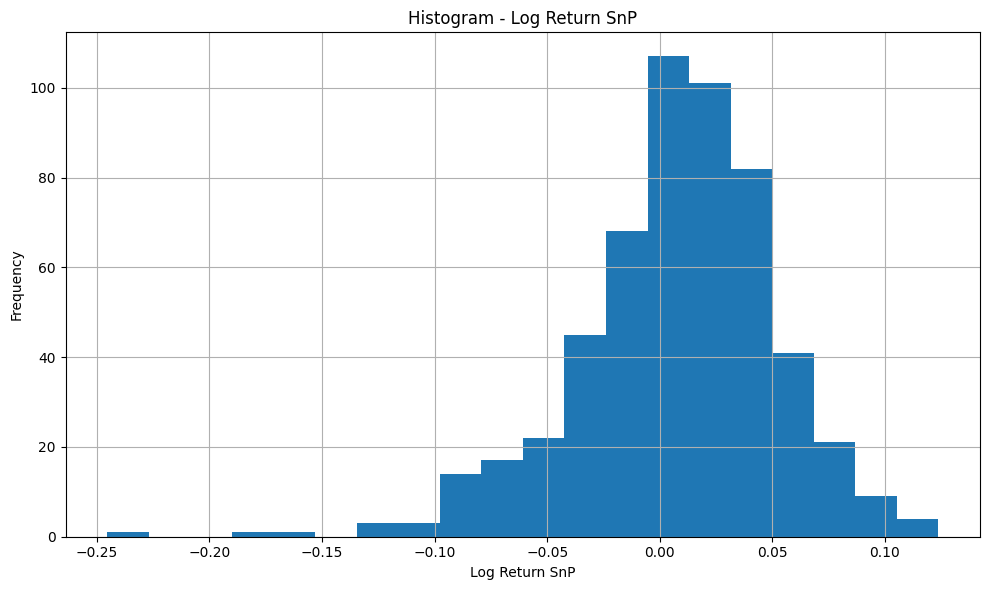

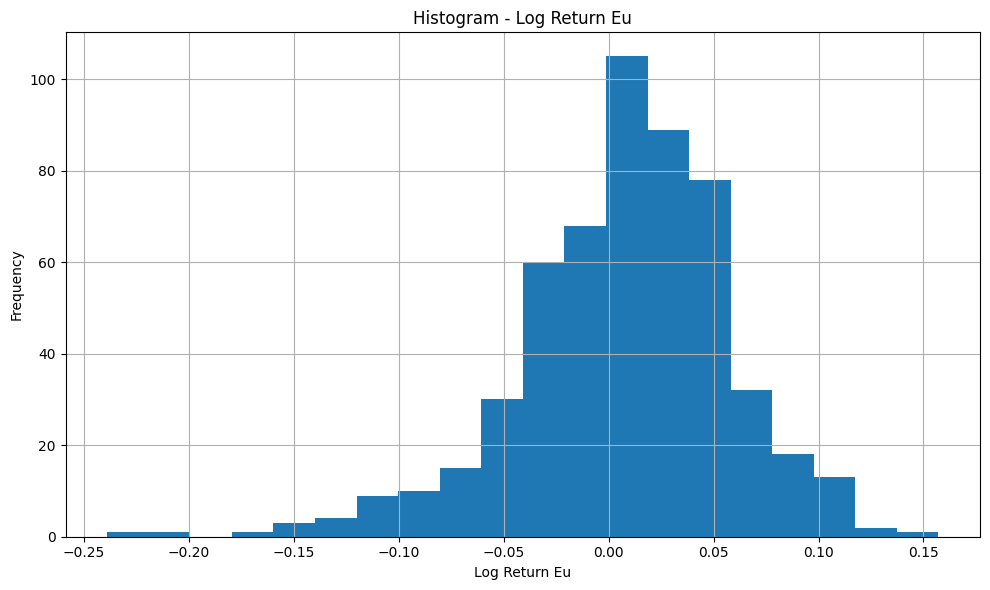

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with log returns

# Create separate figures for each histogram
plt.figure(figsize=(10, 6))  # Adjust figure size as needed

# Histogram for Log Return SnP
plt.hist(df['Log Return_SnP'], bins=20)
plt.xlabel('Log Return SnP')
plt.ylabel('Frequency')
plt.title('Histogram - Log Return SnP')
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))  # Adjust figure size as needed

# Histogram for Log Return Eu
plt.hist(df['Log Return_Eu'], bins=20)
plt.xlabel('Log Return Eu')
plt.ylabel('Frequency')
plt.title('Histogram - Log Return Eu')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
df['Log Return_Eu'].describe()

count    540.000000
mean       0.007306
std        0.050950
min       -0.238823
25%       -0.019857
50%        0.011754
75%        0.040337
max        0.157118
Name: Log Return_Eu, dtype: float64

In [ ]:
print(df.isnull().sum())

Date                         0
IndexVal_SnP                 0
Index_SnP                    0
Return_SnP                   0
Log Return_SnP               0
IndexVal_Eu                  0
Index_Eu                     0
Return_Eu                    0
Log Return_Eu                0
Volatility_SnP              11
Volatility_Eu               11
Volatility_Indicator_SnP     0
Volatility_Indicator_Eu      0
Rolling_corr                11
dtype: int64


## Monte Carlo (Baseline Model)

The Monte Carlo Simulation is a commonly used statistical tool that allows us to account for the uncertainty and variability in market movements. In our case, we specifically used the t-distribution as our base model to simulate log returns because it is better accounting for heavier tails.

In [ ]:
#Fill NaN values with the median of the column
df['Volatility_SnP'].fillna(df['Volatility_SnP'].median(), inplace=True)
df['Volatility_Eu'].fillna(df['Volatility_Eu'].median(), inplace=True)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from math import sqrt
import plotly.graph_objects as go

# Define the number of simulations, degrees of freedom, and the number of periods for forecasting
num_simulations = 1000
degrees_of_freedom = 10
num_periods = 12  # for 12 months ahead

# Function to simulate log returns based on the volatility regime
def simulate_log_returns(mean, std, vol_indicator, num_simulations, num_periods):
    if vol_indicator:
        scale = std * np.sqrt((degrees_of_freedom - 2) / degrees_of_freedom)
    else:
        scale = std * np.sqrt((degrees_of_freedom - 2) / degrees_of_freedom)
    return np.random.standard_t(degrees_of_freedom, (num_simulations, num_periods)) * scale + mean

# Prepare to simulate based on the training data excluding the last 12 months
train_df = df.iloc[:-12]
test_df = df.iloc[-12:]

# Future periods for the simulation
future_periods = pd.date_range(start=test_df['Date'].iloc[0], periods=num_periods, freq='M')

# Running simulations for SnP and EU
simulated_paths_SnP = [simulate_log_returns(row['Log Return_SnP'], row['Volatility_SnP'], row['Volatility_Indicator_SnP'], num_simulations, num_periods) for index, row in train_df.iterrows()]
simulated_paths_Eu = [simulate_log_returns(row['Log Return_Eu'], row['Volatility_Eu'], row['Volatility_Indicator_Eu'], num_simulations, num_periods) for index, row in train_df.iterrows()]

# Convert list of arrays into a single array for easier processing
simulated_paths_SnP = np.concatenate(simulated_paths_SnP, axis=0)
simulated_paths_Eu = np.concatenate(simulated_paths_Eu, axis=0)

# Calculate RMSE using the test data
actual_returns_SnP = test_df['Log Return_SnP'].values
actual_returns_Eu = test_df['Log Return_Eu'].values
predicted_mean_SnP = simulated_paths_SnP.mean(axis=0)
predicted_mean_Eu = simulated_paths_Eu.mean(axis=0)

rmse_SnP = sqrt(mean_squared_error(actual_returns_SnP, predicted_mean_SnP))
rmse_Eu = sqrt(mean_squared_error(actual_returns_Eu, predicted_mean_Eu))

print(f"RMSE for SnP: {rmse_SnP}")
print(f"RMSE for EU: {rmse_Eu}")




RMSE for SnP: 0.041446112652116916
RMSE for EU: 0.04997429210364236


The above code used the Monte Carlo T distribution model to simulate log returns. The data is divided by training and testing set, with testing being the last 12 months of our entire dataset. Finanly, the simulated results were compared to the actual log returns and RMSE values are calculated.

In [ ]:
#sample of 100 paths
sample_size = 100
indices = np.random.choice(simulated_paths_SnP.shape[0], sample_size, replace=False)

fig = go.Figure()
for index in indices:
    fig.add_trace(go.Scatter(showlegend=False, mode='lines', x=future_periods, y=simulated_paths_SnP[index], line=dict(color='blue', width=0.5)))
fig.update_layout(title='Monte Carlo Simulation of Future Log Returns Paths for SnP (Sampled)', xaxis_title='Future Time Periods', yaxis_title='Simulated Log Returns', hovermode='x')
fig.show()

# Sample a subset of 100 paths for EU
sample_size = 100  # Adjust the sample size as needed
indices = np.random.choice(simulated_paths_Eu.shape[0], sample_size, replace=False)

fig = go.Figure()
for index in indices:
    fig.add_trace(go.Scatter(showlegend=False, mode='lines', x=future_periods, y=simulated_paths_Eu[index], line=dict(color='orange', width=0.5)))
fig.update_layout(title='Monte Carlo Simulation of Future Log Returns Paths for EU (Sampled)', xaxis_title='Future Time Periods', yaxis_title='Simulated Log Returns', hovermode='x')
fig.show()


The above code is an example visualization for simulating 100 paths of the SnP and EU index. We can see that they are clustered around 0 with some minior fluctuations.

In [ ]:
mean_path_SnP = np.mean(simulated_paths_SnP, axis=0)
percentile5_SnP = np.percentile(simulated_paths_SnP, 5, axis=0)
percentile95_SnP = np.percentile(simulated_paths_SnP, 95, axis=0)

fig = go.Figure()
fig.add_trace(go.Scatter(x=future_periods, y=mean_path_SnP, mode='lines', name='Mean Path', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=future_periods, y=percentile5_SnP, fill=None, mode='lines', line=dict(color='blue', dash='dot'), showlegend=False))
fig.add_trace(go.Scatter(x=future_periods, y=percentile95_SnP, fill='tonexty', mode='lines', line=dict(color='blue', dash='dot'), fillcolor='rgba(0,0,255,0.2)', name='5th-95th Percentile Range'))
fig.update_layout(title='Monte Carlo Simulation with Mean and Confidence Interval for SnP', xaxis_title='Future Time Periods', yaxis_title='Simulated Log Returns', hovermode='x')
fig.show()


mean_path_Eu = np.mean(simulated_paths_Eu, axis=0)
percentile5_Eu = np.percentile(simulated_paths_Eu, 5, axis=0)
percentile95_Eu = np.percentile(simulated_paths_Eu, 95, axis=0)

fig = go.Figure()
fig.add_trace(go.Scatter(x=future_periods, y=mean_path_Eu, mode='lines', name='Mean Path', line=dict(color='orange')))
fig.add_trace(go.Scatter(x=future_periods, y=percentile5_Eu, fill=None, mode='lines', line=dict(color='orange', dash='dot'), showlegend=False))
fig.add_trace(go.Scatter(x=future_periods, y=percentile95_Eu, fill='tonexty', mode='lines', line=dict(color='orange', dash='dot'), fillcolor='rgba(255,165,0,0.2)', name='5th-95th Percentile Range'))
fig.update_layout(title='Monte Carlo Simulation with Mean and Confidence Interval for EU', xaxis_title='Future Time Periods', yaxis_title='Simulated Log Returns', hovermode='x')
fig.show()


# Tests and Trials before getting to the above mentioned optimised model

In [ ]:

# Calculate the mean and standard deviation of log returns
mean_log_return_SnP = df['Log Return_SnP'].mean()
std_dev_log_return_SnP = df['Log Return_SnP'].std()

mean_log_return_Eu = df['Log Return_Eu'].mean()
std_dev_log_return_Eu = df['Log Return_Eu'].std()

# Set the number of simulations and degrees of freedom for the t-distribution
num_simulations = 10000
degrees_of_freedom = 10  # Example: 10 degrees of freedom

# Simulate one period future log returns using a Student's t-distribution
t_distribution_scale_SnP = std_dev_log_return_SnP * np.sqrt((degrees_of_freedom - 2) / degrees_of_freedom)
t_distribution_scale_Eu = std_dev_log_return_Eu * np.sqrt((degrees_of_freedom - 2) / degrees_of_freedom)

simulated_log_returns_SnP = np.random.standard_t(degrees_of_freedom, num_simulations) * t_distribution_scale_SnP + mean_log_return_SnP
simulated_log_returns_Eu = np.random.standard_t(degrees_of_freedom, num_simulations) * t_distribution_scale_Eu + mean_log_return_Eu


In [ ]:
# Calculate the 95% VaR for the simulated log returns
VaR_95_log_SnP = np.percentile(simulated_log_returns_SnP, 5)
VaR_95_log_Eu = np.percentile(simulated_log_returns_Eu, 5)


In [ ]:
import plotly.graph_objects as go

# Plot histogram for simulated SnP log returns
fig = go.Figure(data=[go.Histogram(x=simulated_log_returns_SnP, nbinsx=50, name='SnP Log Returns')])
fig.update_layout(
    title='Distribution of Simulated SnP Log Returns',
    xaxis_title='Simulated Log Returns',
    yaxis_title='Frequency',
)
fig.add_vline(x=VaR_95_log_SnP, line_dash="dash", line_color="red", annotation_text=f"95% VaR: {VaR_95_log_SnP:.4f}")
fig.show()

# Plot histogram for simulated EU log returns
fig = go.Figure(data=[go.Histogram(x=simulated_log_returns_Eu, nbinsx=50, name='EU Log Returns')])
fig.update_layout(
    title='Distribution of Simulated EU Log Returns',
    xaxis_title='Simulated Log Returns',
    yaxis_title='Frequency',
)
fig.add_vline(x=VaR_95_log_Eu, line_dash="dash", line_color="red", annotation_text=f"95% VaR: {VaR_95_log_Eu:.4f}")
fig.show()

#### Extend the Simulation Over Multiple Periods for Log Returns

In [ ]:
# Define the number of simulations and the degrees of freedom for the t-distribution
num_simulations = 1000
degrees_of_freedom = 10  # Example value, adjust based on your needs

# Define the number of periods to simulate (e.g., 12 for 12 months ahead)
num_periods = 12

# Simulate log returns over multiple periods using a Student's t-distribution
simulated_paths_SnP = np.random.standard_t(degrees_of_freedom, (num_simulations, num_periods)) * std_dev_log_return_SnP + mean_log_return_SnP
simulated_paths_Eu = np.random.standard_t(degrees_of_freedom, (num_simulations, num_periods)) * std_dev_log_return_Eu + mean_log_return_Eu

# Simulated paths are now in shape (num_simulations, num_periods) and represent log returns


In [ ]:
# Create a figure for SnP simulated log returns paths
fig_SnP = go.Figure()

# Set x-axis as a range of future periods (assuming monthly periods)
future_periods = pd.date_range(start=df['Date'].iloc[-1], periods=num_periods, freq='M')

# Add traces for each SnP simulation path
for i in range(num_simulations):
    fig_SnP.add_trace(go.Scatter(showlegend=False, mode='lines', x=future_periods, y=simulated_paths_SnP[i], line=dict(color='blue', width=0.5)))

# Set the title and axis labels
fig_SnP.update_layout(
    title='Monte Carlo Simulation of Future Log Returns Paths for SnP',
    xaxis_title='Future Time Periods',
    yaxis_title='Simulated Log Returns',
    hovermode='x'
)

# Show the plot
fig_SnP.show()


# Create a figure for EU simulated log returns paths
fig_Eu = go.Figure()

# Add traces for each EU simulation path
for i in range(num_simulations):
    fig_Eu.add_trace(go.Scatter(showlegend=False, mode='lines', x=future_periods, y=simulated_paths_Eu[i], line=dict(color='orange', width=0.5)))

# Set the title and axis labels
fig_Eu.update_layout(
    title='Monte Carlo Simulation of Future Log Returns Paths for EU',
    xaxis_title='Future Time Periods',
    yaxis_title='Simulated Log Returns',
    hovermode='x'
)

# Show the plot
fig_Eu.show()



### Calculating RMSE through test train split

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Assuming df is defined and contains 'Date', 'Log Return_SnP', 'Log Return_Eu'

# Split data into training and testing
train_df = df.iloc[:-12]  # All data except last 12 months
test_df = df.iloc[-12:]   # Last 12 months

# Running the Monte Carlo simulation on training data
num_periods = 12  # Forecasting 12 months ahead
num_simulations = 10000  # Number of simulation paths
degrees_of_freedom = 10  # Example value, adjust based on your needs

# Future periods for the simulation
future_periods = pd.date_range(start=test_df['Date'].iloc[0], periods=num_periods, freq='M')

# Using historical mean and standard deviation for simulation
mean_log_return_SnP = train_df['Log Return_SnP'].mean()
std_log_return_SnP = train_df['Log Return_SnP'].std()
mean_log_return_Eu = train_df['Log Return_Eu'].mean()
std_log_return_Eu = train_df['Log Return_Eu'].std()

# Simulate future log returns using Student's t-distribution
simulated_paths_SnP = np.random.standard_t(degrees_of_freedom, (num_simulations, num_periods)) * std_log_return_SnP + mean_log_return_SnP
simulated_paths_Eu = np.random.standard_t(degrees_of_freedom, (num_simulations, num_periods)) * std_log_return_Eu + mean_log_return_Eu

# Calculate RMSE for SnP and EU
predicted_mean_SnP = simulated_paths_SnP.mean(axis=0)
predicted_mean_Eu = simulated_paths_Eu.mean(axis=0)

actual_returns_SnP = test_df['Log Return_SnP'].values
actual_returns_Eu = test_df['Log Return_Eu'].values

rmse_SnP = sqrt(mean_squared_error(actual_returns_SnP, predicted_mean_SnP))
rmse_Eu = sqrt(mean_squared_error(actual_returns_Eu, predicted_mean_Eu))

print(f"RMSE for SnP: {rmse_SnP}")
print(f"RMSE for EU: {rmse_Eu}")

# Plotting the results for SnP
fig_SnP = go.Figure()
for i in range(num_simulations):
    fig_SnP.add_trace(go.Scatter(showlegend=False, mode='lines', x=future_periods, y=simulated_paths_SnP[i], line=dict(color='blue', width=0.5)))
fig_SnP.update_layout(
    title='Monte Carlo Simulation of Future Log Returns Paths for SnP using Student t-Distribution',
    xaxis_title='Future Time Periods',
    yaxis_title='Simulated Log Returns',
    hovermode='x'
)
fig_SnP.show()

# Plotting the results for EU
fig_Eu = go.Figure()
for i in range(num_simulations):
    fig_Eu.add_trace(go.Scatter(showlegend=False, mode='lines', x=future_periods, y=simulated_paths_Eu[i], line=dict(color='orange', width=0.5)))
fig_Eu.update_layout(
    title='Monte Carlo Simulation of Future Log Returns Paths for EU using Student t-Distribution',
    xaxis_title='Future Time Periods',
    yaxis_title='Simulated Log Returns',
    hovermode='x'
)
fig_Eu.show()




RMSE for SnP: 0.041312575696611224
RMSE for EU: 0.04977737149764288


# ARIMA Model

In [ ]:
!pip install pmdarima
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from math import sqrt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 12.4 MB/s eta 0:00:00


Before using ARIMA model, we need to test for stationarity because that is one of the ARIMA assumptions. Below we conducted a Dickey-Fuller test for stationarity and found out the p-value to be less than 0.05, suggesting our data is stationary and is suitable for the ARIMA model.

In [ ]:
# Dickey-Fuller test for stationary test
from statsmodels.tsa.stattools import adfuller

def test_stationarity(timeseries):
    result = adfuller(timeseries.dropna())
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')

# Replace 'Log_Return_SnP' with your actual column name if different
test_stationarity(df1['Log Return_SnP'])

ADF Statistic: -22.938525140151413
p-value: 0.0
Critical Values:
	1%: -3.4425405682241816
	5%: -2.8669171671779816
	10%: -2.5696338432333636


Notice that the p-value is less than 0.05, which means the series is stationary, so we can proceed with building the ARIMA model

In [ ]:
from pmdarima import auto_arima

model_snp = auto_arima(df1['Log Return_SnP'].dropna(), seasonal=False, trace=True,
                   error_action='ignore', suppress_warnings=True,
                   stepwise=False, max_order=None, test='adf',
                   start_p=0, start_q=0, max_p=5, max_q=5)

print(model_snp.summary())

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-1818.742, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-1817.454, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-1816.033, Time=0.18 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-1815.712, Time=0.18 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-1813.733, Time=0.30 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-1817.851, Time=0.38 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-1817.415, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-1818.593, Time=0.33 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-1813.586, Time=0.16 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=-1815.006, Time=0.68 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=-1813.002, Time=2.11 sec
 ARIMA(1,0,5)(0,0,0)[0]             : AIC=-1816.613, Time=0.89 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-1815.918, Time=0.35 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-1813.950, Time=0.46 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=1.13 sec
 

We used the auto_arima function in the pmdarima library to automatically select the best combinations of lagged values for the AR and MA components. The model with the lowest AIC was selected at the end.

Best model for SnP: ARIMA(3,0,3)

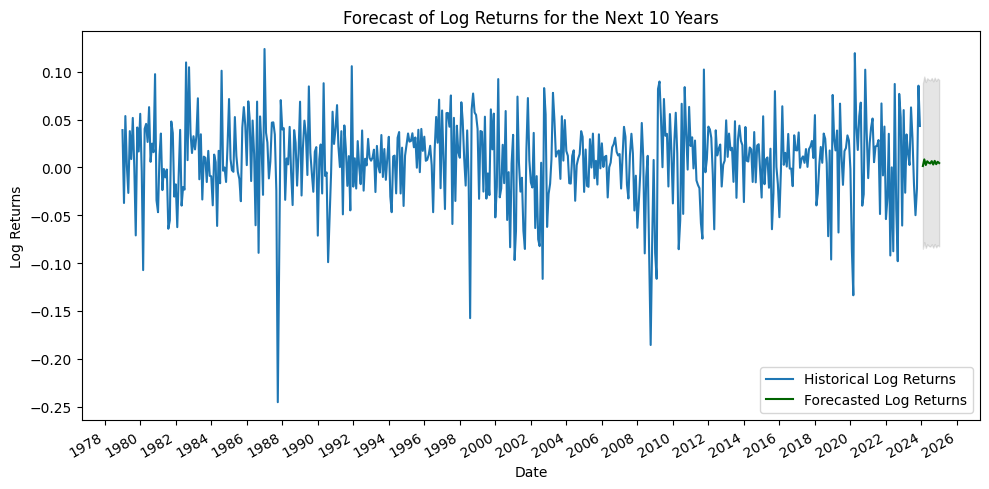

In [ ]:
df1['Date'] = pd.to_datetime(df1['Date'])
n_periods = 12
fc, confint = model_snp.predict(n_periods=n_periods, return_conf_int=True)

last_historical_date = df1['Date'].iloc[-1]

# Generate the forecast dates
forecast_dates = pd.date_range(start=last_historical_date, periods=n_periods + 1, freq='M')[1:]

# Create forecast series
fc_series = pd.Series(fc, index=forecast_dates)
lower_series = pd.Series(confint[:, 0], index=forecast_dates)
upper_series = pd.Series(confint[:, 1], index=forecast_dates)

# Plotting
plt.figure(figsize=(10, 5))

# Plot historical log returns
plt.plot(df1['Date'], df1['Log Return_SnP'], label='Historical Log Returns')

# Plot forecasted log returns
plt.plot(forecast_dates, fc, color='darkgreen', label='Forecasted Log Returns')

# Plot the confidence intervals
plt.fill_between(forecast_dates, confint[:, 0], confint[:, 1], color='k', alpha=0.1)

# Title and labels
plt.title("Forecast of Log Returns for the Next 10 Years")
plt.xlabel("Date")
plt.ylabel("Log Returns")

# Format x-axis to show dates every two years
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator(2))

# Rotate x-axis labels for better visibility
plt.gcf().autofmt_xdate()

plt.legend()
plt.tight_layout()
plt.show()

Using the ARIMA model to predict one year of log returns in the future. The result graph shows that ARIMA smoothes out the extreme values and predict a stable return around 0.

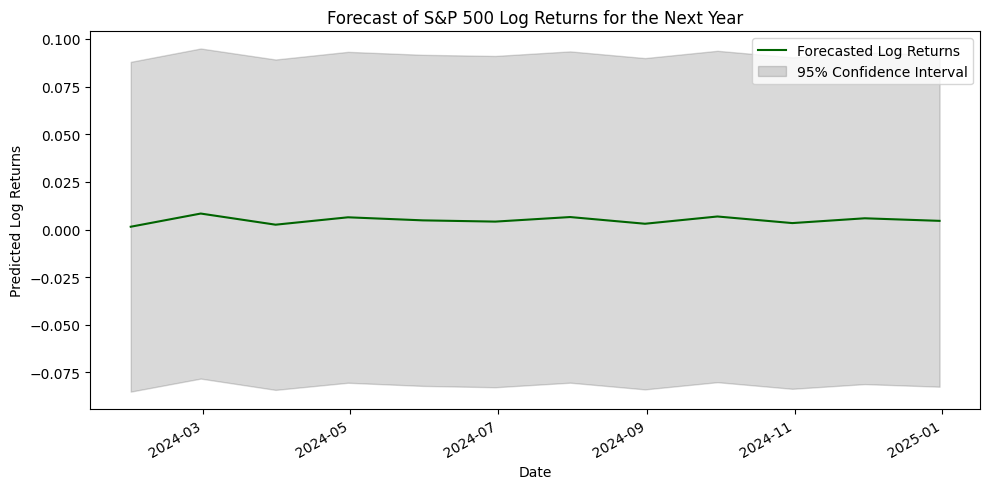

In [ ]:
plt.figure(figsize=(10, 5))

# Plot forecasted log returns
plt.plot(forecast_dates, fc, color='darkgreen', label='Forecasted Log Returns')

# Plot the confidence intervals for the forecasted values
plt.fill_between(forecast_dates, lower_series, upper_series, color='k', alpha=0.15, label='95% Confidence Interval')

# Title and labels
plt.title("Forecast of S&P 500 Log Returns for the Next Year")
plt.xlabel("Date")
plt.ylabel("Predicted Log Returns")

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

plt.gcf().autofmt_xdate()

plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# arima model for eu index
model_Eu = auto_arima(df1['Log Return_Eu'].dropna(), seasonal=False, trace=True,
                   error_action='ignore', suppress_warnings=True,
                   stepwise=False, max_order=None, test='adf',
                   start_p=0, start_q=0, max_p=5, max_q=5)

print(model_Eu.summary())

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-1670.600, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-1670.890, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-1668.957, Time=0.13 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-1669.029, Time=0.29 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-1669.447, Time=1.46 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-1670.726, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-1670.845, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-1669.392, Time=0.22 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=-1671.143, Time=0.38 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=-1669.635, Time=0.83 sec
 ARIMA(1,0,5)(0,0,0)[0]             : AIC=-1668.820, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-1668.879, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-1666.900, Time=0.18 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-1669.124, Time=0.66 sec
 

The auto_arima function in the pmdarima library to automatically select the best combinations of lagged values for the AR and MA components. The model with the lowest AIC was selected at the end.

Best model for MSCI EU: ARIMA(1,0,3)

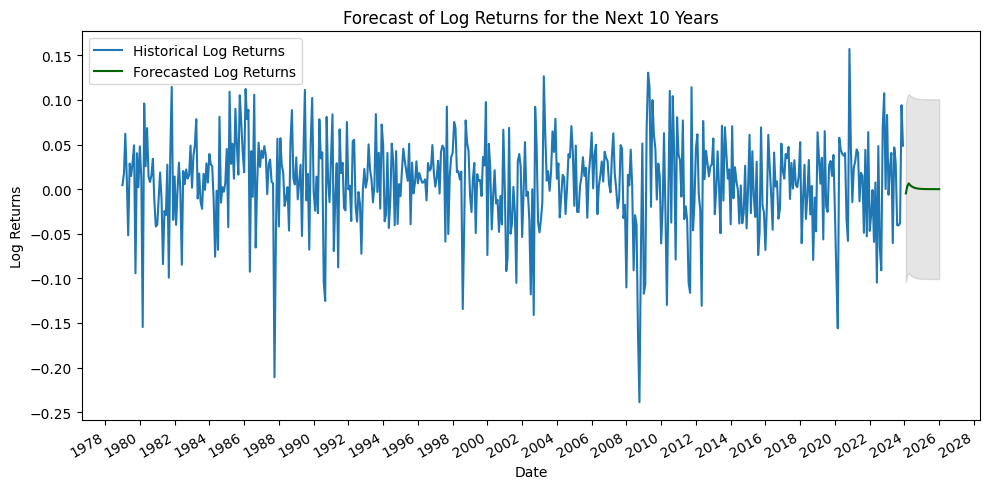

In [ ]:
df1['Date'] = pd.to_datetime(df1['Date'])
n_periods = 24
fc, confint = model_Eu.predict(n_periods=n_periods, return_conf_int=True)

# The last date in your historical data
last_historical_date = df1['Date'].iloc[-1]

# Generate the forecast dates
forecast_dates = pd.date_range(start=last_historical_date, periods=n_periods + 1, freq='M')[1:]

# Create forecast series
fc_series = pd.Series(fc, index=forecast_dates)
lower_series = pd.Series(confint[:, 0], index=forecast_dates)
upper_series = pd.Series(confint[:, 1], index=forecast_dates)

# Plotting
plt.figure(figsize=(10, 5))

# Plot historical log returns
plt.plot(df1['Date'], df1['Log Return_Eu'], label='Historical Log Returns')

# Plot forecasted log returns
plt.plot(forecast_dates, fc, color='darkgreen', label='Forecasted Log Returns')

# Plot the confidence intervals
plt.fill_between(forecast_dates, confint[:, 0], confint[:, 1], color='k', alpha=0.1)

# Title and labels
plt.title("Forecast of Log Returns for the Next 10 Years")
plt.xlabel("Date")
plt.ylabel("Log Returns")

# Format x-axis to show dates every two years
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.gca().xaxis.set_major_locator(mdates.YearLocator(2))

# Rotate x-axis labels for better visibility
plt.gcf().autofmt_xdate()

plt.legend()
plt.tight_layout()
plt.show()

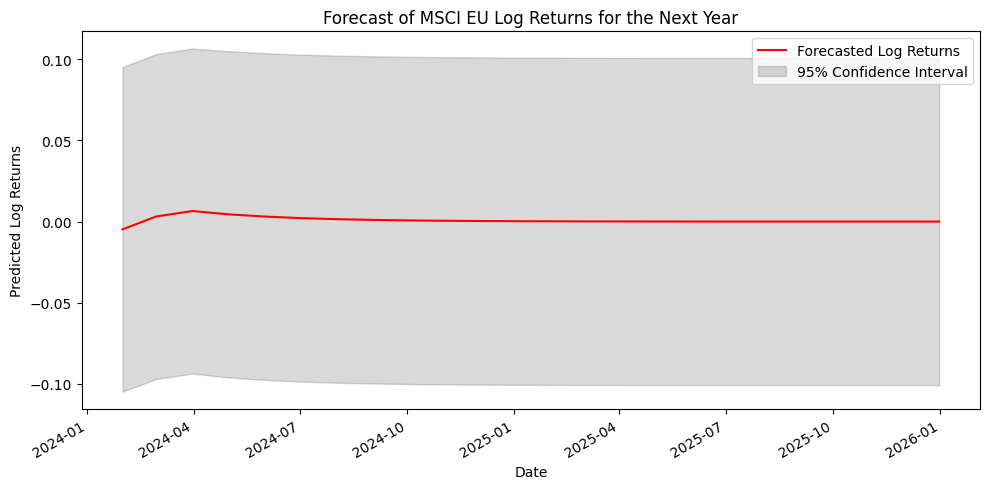

In [ ]:
plt.figure(figsize=(10, 5))

# Plot forecasted log returns
plt.plot(forecast_dates, fc, color='red', label='Forecasted Log Returns')

# Plot the confidence intervals for the forecasted values
plt.fill_between(forecast_dates, lower_series, upper_series, color='k', alpha=0.15, label='95% Confidence Interval')

# Title and labels
plt.title("Forecast of MSCI EU Log Returns for the Next Year")
plt.xlabel("Date")
plt.ylabel("Predicted Log Returns")

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Rotate and align the tick labels so they look better
plt.gcf().autofmt_xdate()

plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# spliting train and test data for evaluating rmse

train_df = df1.iloc[:-12]  # All data except the last 12 months
test_df = df1.iloc[-12:]   # Last 12 months

model_snp = auto_arima(train_df['Log Return_SnP'].dropna(), seasonal=False, trace=True,
                       error_action='ignore', suppress_warnings=True,
                       stepwise=False, max_order=None, test='adf',
                       start_p=0, start_q=0, max_p=5, max_q=5)

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-1777.747, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-1776.488, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-1775.088, Time=0.24 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-1774.930, Time=0.56 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-1773.003, Time=0.57 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-1776.325, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-1776.446, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-1774.469, Time=0.15 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-1773.036, Time=0.19 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=-1774.174, Time=0.55 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=-1770.958, Time=0.44 sec
 ARIMA(1,0,5)(0,0,0)[0]             : AIC=-1775.715, Time=0.70 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-1774.968, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-1775.958, Time=0.45 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.78 sec
 

In [ ]:
model_Eu = auto_arima(train_df['Log Return_Eu'].dropna(), seasonal=False, trace=True,
                       error_action='ignore', suppress_warnings=True,
                       stepwise=False, max_order=None, test='adf',
                       start_p=0, start_q=0, max_p=5, max_q=5)

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-1633.489, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-1633.867, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-1631.951, Time=0.11 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-1631.761, Time=0.15 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-1632.799, Time=0.42 sec
 ARIMA(0,0,5)(0,0,0)[0]             : AIC=-1633.567, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-1633.812, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-1632.105, Time=0.13 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-1633.316, Time=0.57 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=-1634.225, Time=1.19 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=-1632.924, Time=1.03 sec
 ARIMA(1,0,5)(0,0,0)[0]             : AIC=-1631.812, Time=1.29 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-1631.864, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-1629.889, Time=0.20 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-1632.322, Time=0.66

In [ ]:
forecast_results_snp = model_snp.predict(n_periods=12)

actual_returns_SnP = test_df['Log Return_SnP'].values
rmse_SnP = sqrt(mean_squared_error(actual_returns_SnP, forecast_results_snp))

forecast_results_Eu = model_Eu.predict(n_periods=12)

actual_returns_Eu = test_df['Log Return_Eu'].values
rmse_Eu = sqrt(mean_squared_error(actual_returns_Eu, forecast_results_Eu))

print(f"RMSE for S&P: {rmse_SnP}")
print(f"RMSE for EU: {rmse_Eu}")

RMSE for S&P: 0.04382484719238713
RMSE for EU: 0.05180358950432609


Final RMSE for our two indices. The ARIMA results will be served as a baseline for other mo

# Monte Carlo Stimulation using time-varying volatility model - GARCH to forecast future volatility

To incorporate a GARCH model for forecasting future volatility in our analysis, we will need to:

* Fit a GARCH model to our historical log returns to understand volatility dynamics.
* Use the fitted GARCH model to forecast future volatility.
* Use the forecasted volatility in your Monte Carlo simulations to generate potential future log returns.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 7.2 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001958. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002591. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




GARCH Model Summary for SnP:
                     Constant Mean - GARCH Model Results                      
Dep. Variable:         Log Return_SnP   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                940.185
Distribution:                  Normal   AIC:                          -1872.37
Method:            Maximum Likelihood   BIC:                          -1855.20
                                        No. Observations:                  540
Date:                Wed, Apr 24 2024   Df Residuals:                      539
Time:                        21:54:56   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu         7.4320e-03  1.798e

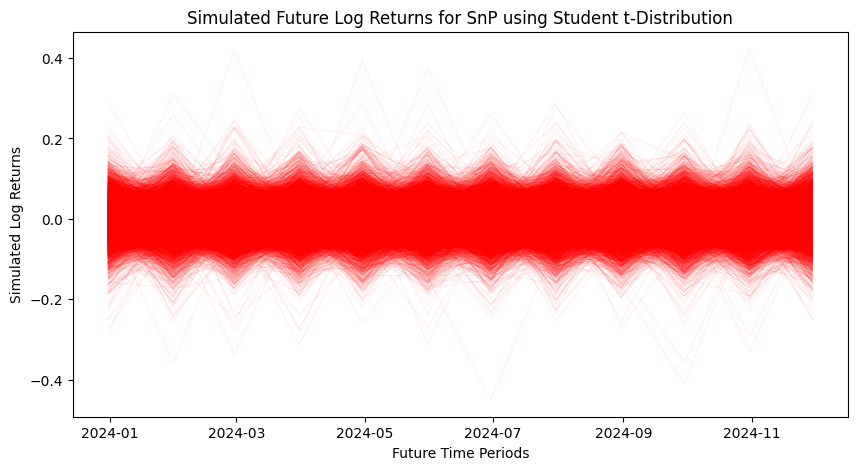

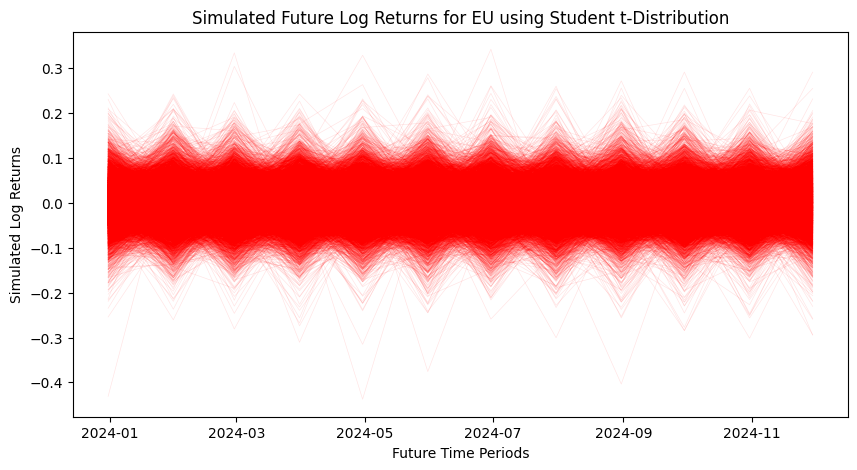

RMSE for SnP: 0.04409874752756366
RMSE for EU: 0.051372915700579155


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001963. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002593. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




In [ ]:
!pip install arch
from arch import arch_model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
# Define constants
num_periods = 12  # One year of monthly data
num_simulations = 10000
degrees_of_freedom = 10

# Fit the GARCH model, we firstly used GARCH(1,1), as the PACF analysis
# showed that a single lag GARCH model has the siginificant correlation.
def forecast_volatility(returns, p=1, q=1):
    garch = arch_model(returns, p=p, q=q)
    fitted_model = garch.fit(disp='off')
    forecast = fitted_model.forecast(horizon=num_periods)
    future_volatility = np.sqrt(forecast.variance.values[-1])
    return future_volatility, fitted_model

# Applying the GARCH forecast function
future_vol_SnP, model_SnP = forecast_volatility(df['Log Return_SnP'].dropna())
future_vol_Eu, model_Eu = forecast_volatility(df['Log Return_Eu'].dropna())

print("GARCH Model Summary for SnP:")
print(model_SnP.summary())
print("GARCH Model Summary for EU:")
print(model_Eu.summary())

# Monte Carlo simulation using forecasted volatility and Student's t-distribution
def monte_carlo_simulation(volatility, mean_return=0, t_degrees=10):
    t_scale = volatility * np.sqrt((t_degrees - 2) / t_degrees)
    return np.random.standard_t(t_degrees, size=(num_simulations, num_periods)) * t_scale + mean_return

simulated_returns_SnP = monte_carlo_simulation(future_vol_SnP)
simulated_returns_Eu = monte_carlo_simulation(future_vol_Eu)

# Plotting function for Monte Carlo simulation results
def plot_simulated_paths(simulated_returns, title):
    plt.figure(figsize=(10, 5))
    for sim in simulated_returns:
        plt.plot(pd.date_range(start=df['Date'].iloc[-1], periods=num_periods, freq='M'), sim, 'r-', lw=0.5, alpha=0.1)
    plt.title(title)
    plt.xlabel('Future Time Periods')
    plt.ylabel('Simulated Log Returns')
    plt.show()
plot_simulated_paths(simulated_returns_SnP, 'Simulated Future Log Returns for SnP using Student t-Distribution')
plot_simulated_paths(simulated_returns_Eu, 'Simulated Future Log Returns for EU using Student t-Distribution')
def calculate_rmse(actuals, predictions):
    return np.sqrt(mean_squared_error(actuals, predictions.mean(axis=0)))
train_data = df.iloc[:-12]
test_data = df.iloc[-12:]
volatility_SnP = forecast_volatility(train_data['Log Return_SnP'].dropna())[0]
volatility_Eu = forecast_volatility(train_data['Log Return_Eu'].dropna())[0]
simulated_returns_SnP = monte_carlo_simulation(volatility_SnP)
simulated_returns_Eu = monte_carlo_simulation(volatility_Eu)
rmse_SnP = calculate_rmse(test_data['Log Return_SnP'].dropna(), simulated_returns_SnP)
rmse_Eu = calculate_rmse(test_data['Log Return_Eu'].dropna(), simulated_returns_Eu)
print(f"RMSE for SnP: {rmse_SnP}")
print(f"RMSE for EU: {rmse_Eu}")


##Model Parameter Selection
**PACF**:
The PACF is a tool used in time series analysis to measure the extent of association between a variable and its lagged values, with the relationships at all shorter lags removed.

**Significant Lag**:
The first lag shows a very high partial autocorrelation (close to 1), and this value declines rapidly as the lag increases. This suggests that there is a significant correlation between the series and its first lag.

**Model Specification**:
When choosing a GARCH model, the PACF plot can help to identify the appropriate number of lags to include in the model. Since only the first lag seems to be significant, this suggests a GARCH model with a
single lag (GARCH(1,1)) is more suitable.


In [ ]:
from arch import arch_model
from sklearn.metrics import mean_squared_error
from math import sqrt
import numpy as np
import pandas as pd

def evaluate_garch_model(returns, forecast_horizon, test_returns, model_type='GARCH', p=1, q=1):
    if model_type == 'GARCH':
        model = arch_model(returns, vol='Garch', p=p, q=q)
    elif model_type == 'EGARCH':
        model = arch_model(returns, vol='EGARCH', p=p, q=q)
    elif model_type == 'TGARCH':
        model = arch_model(returns, vol='Garch', p=p, q=q, o=1)  # TGARCH is a GARCH model with one order of asymmetry

    fitted_model = model.fit(disp='off')
    # Use simulation for forecasting to handle horizons greater than 1
    forecast = fitted_model.forecast(horizon=forecast_horizon, method='simulation', simulations=1000)
    future_volatility = np.sqrt(forecast.variance.mean(axis=0).iloc[-1])  # Use the mean of simulated variances

    # Simulate future log returns using the forecasted volatilities and Student's t-distribution
    simulated_returns = np.random.standard_t(10, size=(10000, forecast_horizon)) * future_volatility

    # Calculate the mean of simulated returns
    mean_simulated_returns = simulated_returns.mean(axis=0)

    # Calculate RMSE
    rmse = sqrt(mean_squared_error(test_returns, mean_simulated_returns))

    return rmse, fitted_model

train_data = df.iloc[:-12]
test_data = df.iloc[-12:]
train_returns_SnP = train_data['Log Return_SnP'].dropna()
test_returns_SnP = test_data['Log Return_SnP'].dropna()


forecast_horizon = 12  # One year of monthly data

# Evaluate different GARCH models
rmse_garch, model_garch = evaluate_garch_model(train_returns_SnP, forecast_horizon, test_returns_SnP, 'GARCH', 1, 1)
rmse_egarch, model_egarch = evaluate_garch_model(train_returns_SnP, forecast_horizon, test_returns_SnP, 'EGARCH', 1, 1)
rmse_tgarch, model_tgarch = evaluate_garch_model(train_returns_SnP, forecast_horizon, test_returns_SnP, 'TGARCH', 1, 1)

print("RMSE GARCH(1,1):", rmse_garch)
print("RMSE EGARCH(1,1):", rmse_egarch)
print("RMSE TGARCH(1,1,1):", rmse_tgarch)

# Determine the best model
best_rmse = min(rmse_garch, rmse_egarch, rmse_tgarch)
print("Best RMSE:", best_rmse)


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001963. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001963. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




RMSE GARCH(1,1): 0.04356250555115194
RMSE EGARCH(1,1): 0.0435544198694747
RMSE TGARCH(1,1,1): 0.04389519944884236
Best RMSE: 0.0435544198694747


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001963. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




### **Best Model**

Since we got our best performed GARCH model which is EGARCH Model. The EGARCH model considers asymmetric effects, meaning it can differentiate between the impact of positive and negative effects on volatility.
Unlike standard GARCH models, which only model volatility as a function of past squared returns, the EGARCH model allows for past values to have different effects on current volatility.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001958. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002591. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




EGARCH Model Summary for SnP:
                     Constant Mean - EGARCH Model Results                     
Dep. Variable:         Log Return_SnP   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                     EGARCH   Log-Likelihood:                941.957
Distribution:                  Normal   AIC:                          -1875.91
Method:            Maximum Likelihood   BIC:                          -1858.75
                                        No. Observations:                  540
Date:                Wed, Apr 24 2024   Df Residuals:                      539
Time:                        21:55:29   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu         7.7677e-03  1.780

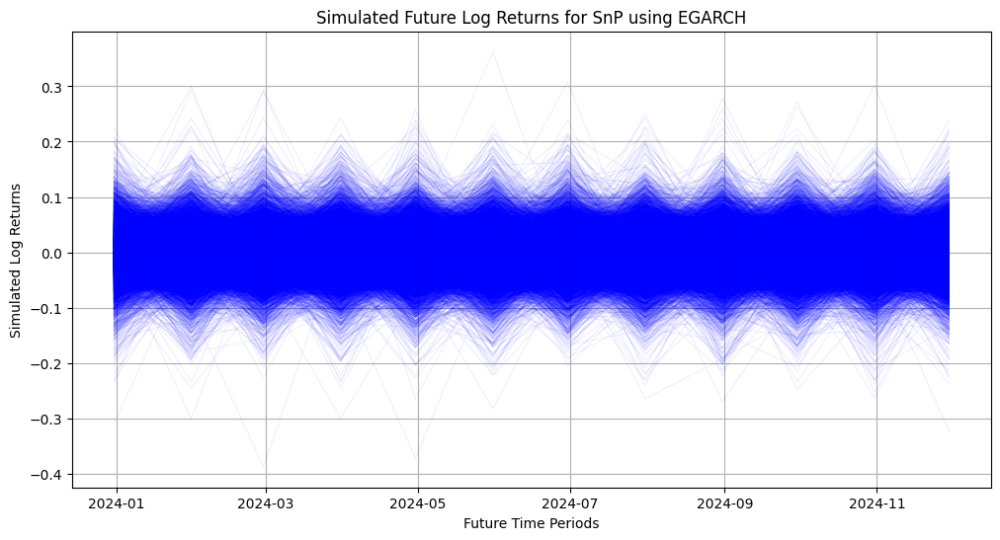

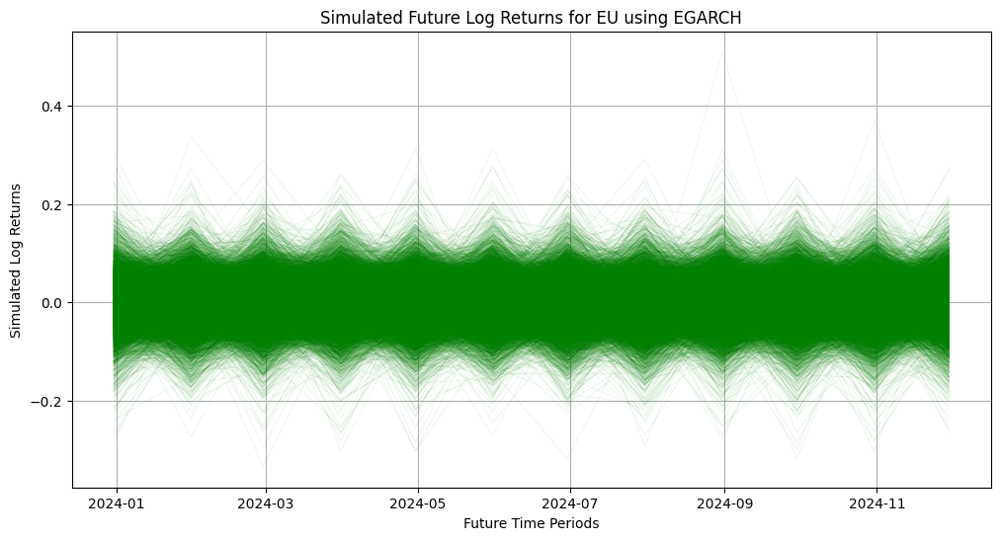

RMSE for SnP: 0.04355713318879383
RMSE for EU: 0.05159284092495552


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001963. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002593. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




In [ ]:
# Define constants
num_periods = 12  # One year of monthly data
num_simulations = 10000
degrees_of_freedom = 10  # Adjust based on the characteristics of your data

# Function to fit an EGARCH model and forecast future volatility
def forecast_volatility(returns, p=1, q=1, model_type='EGARCH'):
    if model_type == 'EGARCH':
        model = arch_model(returns, vol='EGARCH', p=p, q=q)
    else:
        model = arch_model(returns, p=p, q=q)  # default to GARCH if not specified

    fitted_model = model.fit(disp='off')
    forecast = fitted_model.forecast(horizon=num_periods, method='simulation', simulations=500)
    future_volatility = np.sqrt(forecast.variance.mean(axis=0).iloc[-1])  # Average simulations for volatility
    return future_volatility, fitted_model

# Applying the EGARCH forecast function
future_vol_SnP, model_SnP = forecast_volatility(df['Log Return_SnP'].dropna(), model_type='EGARCH')
future_vol_Eu, model_Eu = forecast_volatility(df['Log Return_Eu'].dropna(), model_type='EGARCH')

print("EGARCH Model Summary for SnP:")
print(model_SnP.summary())
print("EGARCH Model Summary for EU:")
print(model_Eu.summary())

# Monte Carlo simulation using forecasted volatility and Student's t-distribution
def monte_carlo_simulation(volatility, mean_return=0, t_degrees=10):
    t_scale = volatility * np.sqrt((t_degrees - 2) / t_degrees)
    return np.random.standard_t(t_degrees, size=(num_simulations, num_periods)) * t_scale + mean_return

simulated_returns_SnP = monte_carlo_simulation(future_vol_SnP)
simulated_returns_Eu = monte_carlo_simulation(future_vol_Eu)


def plot_simulated_paths(simulated_returns, title, color):
    plt.figure(figsize=(12, 6))
    for sim in simulated_returns:
        plt.plot(pd.date_range(start=df['Date'].iloc[-1], periods=num_periods, freq='M'), sim, '-', lw=0.5, alpha=0.1, color=color)
    plt.title(title)
    plt.xlabel('Future Time Periods')
    plt.ylabel('Simulated Log Returns')
    plt.grid(True)  # Adding grid for better readability
    plt.show()

plot_simulated_paths(simulated_returns_SnP, 'Simulated Future Log Returns for SnP using EGARCH', 'blue')
plot_simulated_paths(simulated_returns_Eu, 'Simulated Future Log Returns for EU using EGARCH', 'green')

# Function to calculate RMSE
def calculate_rmse(actuals, predictions):
    return np.sqrt(mean_squared_error(actuals, predictions.mean(axis=0)))

# Testing the model by splitting the data into train and test sets
train_data = df.iloc[:-12]
test_data = df.iloc[-12:]
volatility_SnP = forecast_volatility(train_data['Log Return_SnP'].dropna(), model_type='EGARCH')[0]
volatility_Eu = forecast_volatility(train_data['Log Return_Eu'].dropna(), model_type='EGARCH')[0]

# Run simulations
simulated_returns_SnP = monte_carlo_simulation(volatility_SnP)
simulated_returns_Eu = monte_carlo_simulation(volatility_Eu)

# Calculate RMSE for both indices
rmse_SnP = calculate_rmse(test_data['Log Return_SnP'].dropna(), simulated_returns_SnP)
rmse_Eu = calculate_rmse(test_data['Log Return_Eu'].dropna(), simulated_returns_Eu)

print(f"RMSE for SnP: {rmse_SnP}")
print(f"RMSE for EU: {rmse_Eu}")


## **EGARCH model including Volatility Metrics**

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001958. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002591. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




GARCH Model Summary for SnP:
                     Constant Mean - GARCH Model Results                      
Dep. Variable:         Log Return_SnP   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                940.185
Distribution:                  Normal   AIC:                          -1872.37
Method:            Maximum Likelihood   BIC:                          -1855.20
                                        No. Observations:                  540
Date:                Wed, Apr 24 2024   Df Residuals:                      539
Time:                        21:56:26   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu         7.4320e-03  1.798e

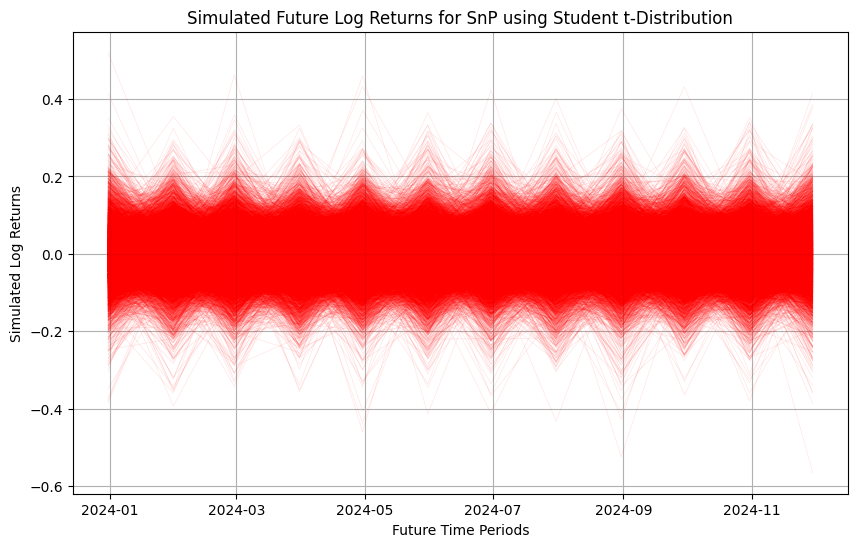

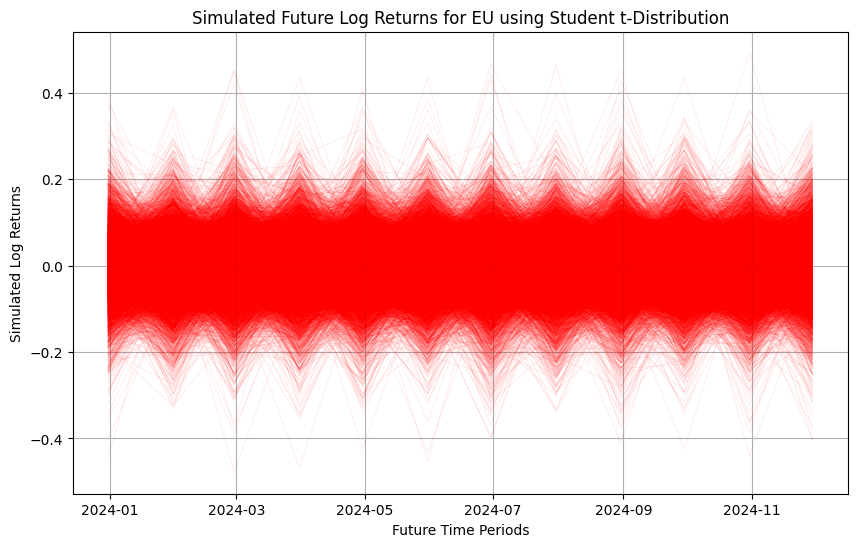

RMSE for SnP: 0.043539847765243896
RMSE for EU: 0.05082860572775284


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001963. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002593. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




In [ ]:
from arch import arch_model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn.metrics import mean_squared_error

# Define constants
num_periods = 12  # One year of monthly data
num_simulations = 10000
degrees_of_freedom = 10  # Adjust based on the characteristics of your data

# Function to fit GARCH model and forecast future volatility
def forecast_volatility(returns, p=1, q=1, indicator=None):
    garch = arch_model(returns, p=p, q=q)
    fitted_model = garch.fit(disp='off')
    forecast = fitted_model.forecast(horizon=num_periods)
    future_volatility = np.sqrt(forecast.variance.values[-1])

    # Adjusting forecasted volatility based on the volatility indicator
    if indicator is not None and len(indicator) == len(future_volatility):
        future_volatility *= (1 + 0.5 * indicator[-num_periods:])  # Increase volatility by 50% where indicator is 1

    return future_volatility, fitted_model

# Applying the GARCH forecast function with volatility indicators
indicator_SnP = df['Volatility_Indicator_SnP'].iloc[-num_periods:].values  # Example to align the indicator length
indicator_Eu = df['Volatility_Indicator_Eu'].iloc[-num_periods:].values

future_vol_SnP, model_SnP = forecast_volatility(df['Log Return_SnP'].dropna(), indicator=indicator_SnP)
future_vol_Eu, model_Eu = forecast_volatility(df['Log Return_Eu'].dropna(), indicator=indicator_Eu)

print("GARCH Model Summary for SnP:")
print(model_SnP.summary())
print("GARCH Model Summary for EU:")
print(model_Eu.summary())

# Monte Carlo simulation using forecasted volatility and Student's t-distribution
def monte_carlo_simulation(volatility, mean_return=0, t_degrees=10):
    t_scale = volatility * np.sqrt((t_degrees - 2) / t_degrees)
    return np.random.standard_t(t_degrees, size=(num_simulations, num_periods)) * t_scale + mean_return

simulated_returns_SnP = monte_carlo_simulation(future_vol_SnP)
simulated_returns_Eu = monte_carlo_simulation(future_vol_Eu)

# Plotting function for Monte Carlo simulation results
def plot_simulated_paths(simulated_returns, title):
    plt.figure(figsize=(10, 6))
    for sim in simulated_returns:
        plt.plot(pd.date_range(start=df['Date'].iloc[-1], periods=num_periods, freq='M'), sim, 'r-', lw=0.5, alpha=0.1)
    plt.title(title)
    plt.xlabel('Future Time Periods')
    plt.ylabel('Simulated Log Returns')
    plt.grid(True)
    plt.show()

plot_simulated_paths(simulated_returns_SnP, 'Simulated Future Log Returns for SnP using Student t-Distribution')
plot_simulated_paths(simulated_returns_Eu, 'Simulated Future Log Returns for EU using Student t-Distribution')

# Function to calculate RMSE
def calculate_rmse(actuals, predictions):
    return np.sqrt(mean_squared_error(actuals, predictions.mean(axis=0)))

# Testing the model by splitting the data into train and test sets
train_data = df.iloc[:-12]
test_data = df.iloc[-12:]
volatility_SnP = forecast_volatility(train_data['Log Return_SnP'].dropna(), indicator=train_data['Volatility_Indicator_SnP'].iloc[-12:].values)[0]
volatility_Eu = forecast_volatility(train_data['Log Return_Eu'].dropna(), indicator=train_data['Volatility_Indicator_Eu'].iloc[-12:].values)[0]

# Run simulations
simulated_returns_SnP = monte_carlo_simulation(volatility_SnP)
simulated_returns_Eu = monte_carlo_simulation(volatility_Eu)

# Calculate RMSE for both indices
rmse_SnP = calculate_rmse(test_data['Log Return_SnP'].dropna(), simulated_returns_SnP)
rmse_Eu = calculate_rmse(test_data['Log Return_Eu'].dropna(), simulated_returns_Eu)

print(f"RMSE for SnP: {rmse_SnP}")
print(f"RMSE for EU: {rmse_Eu}")


##**Best RMSE scores through Monte Carlo + GARCH T**

**RMSE for SnP: 0.043263092237323574**

**RMSE for EU: 0.051210857866312215**

# Tests and Trials before getting to the above mentioned optimised model

In [ ]:
!pip install arch

GARCH Model Fitting and Forecasting

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001958. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002591. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




                     Constant Mean - GARCH Model Results                      
Dep. Variable:         Log Return_SnP   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:                940.185
Distribution:                  Normal   AIC:                          -1872.37
Method:            Maximum Likelihood   BIC:                          -1855.20
                                        No. Observations:                  540
Date:                Wed, Apr 24 2024   Df Residuals:                      539
Time:                        21:57:28   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu         7.4320e-03  1.798e-03      4.134  3.559e-05 [3.

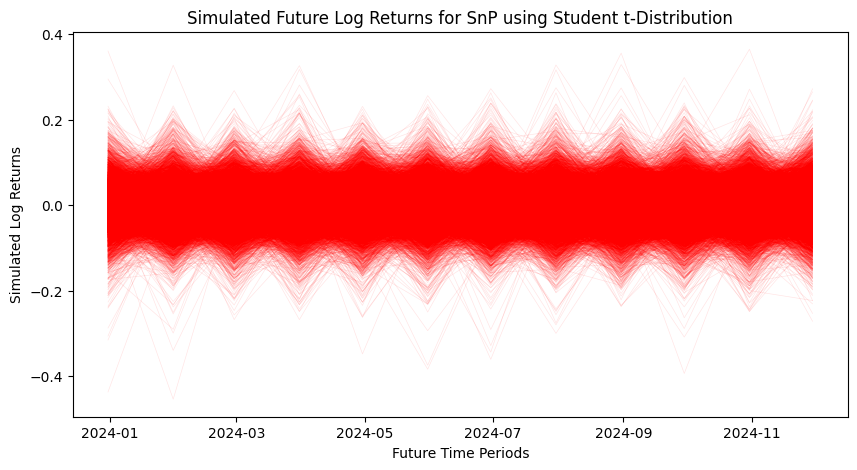

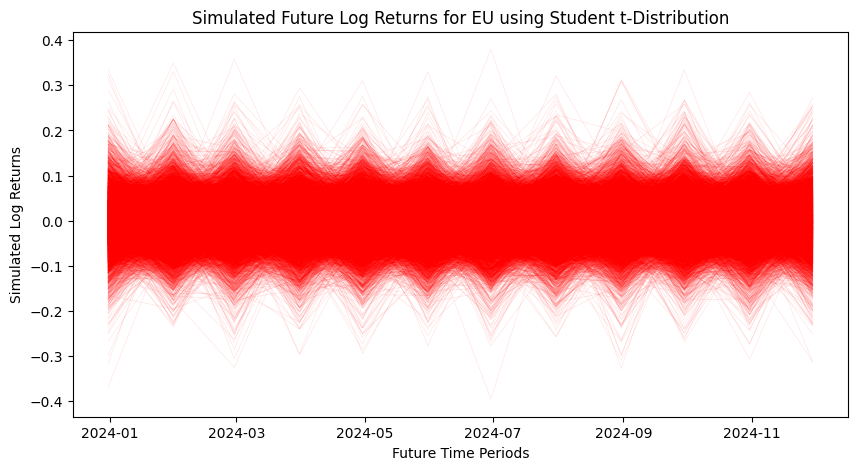

In [ ]:
from arch import arch_model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the number of forecast periods (1 year of monthly data)
num_periods = 12
degrees_of_freedom = 10  # Adjust based on your data characteristics

# Step 1: Fit GARCH model and forecast volatility
def fit_forecast_garch(returns):
    # Fit a GARCH(1,1) model
    garch = arch_model(returns, p=1, q=1)
    res = garch.fit(disp='off')
    # Forecast future volatility
    forecast = res.forecast(horizon=num_periods)
    # Extract forecasted volatility
    future_vol = np.sqrt(forecast.variance.values[-1, :])
    return future_vol, res

# SnP
future_vol_SnP, res_SnP = fit_forecast_garch(df['Log Return_SnP'].dropna())
print(res_SnP.summary())

# EU
future_vol_Eu, res_Eu = fit_forecast_garch(df['Log Return_Eu'].dropna())
print(res_Eu.summary())

# Step 2: Monte Carlo Simulation
def monte_carlo_simulation(mean, vol, num_simulations=10000):
    # Ensure 'vol' is correctly shaped for broadcasting
    vol = vol.reshape(1, num_periods)  # Adjust if necessary
    # Simulate future log returns using the forecasted volatilities
    simulated_paths = np.random.standard_t(degrees_of_freedom, size=(num_simulations, num_periods)) * vol + mean
    return simulated_paths

simulated_returns_SnP = monte_carlo_simulation(0, future_vol_SnP)
simulated_returns_Eu = monte_carlo_simulation(0, future_vol_Eu)

# Step 3: Plot simulated paths
def plot_simulated_paths(simulated_returns, title):
    plt.figure(figsize=(10, 5))
    for sim in simulated_returns:
        plt.plot(pd.date_range(start=df['Date'].iloc[-1], periods=num_periods, freq='M'), sim, 'r-', lw=0.5, alpha=0.1)
    plt.title(title)
    plt.xlabel('Future Time Periods')
    plt.ylabel('Simulated Log Returns')
    plt.show()

plot_simulated_paths(simulated_returns_SnP, 'Simulated Future Log Returns for SnP using Student t-Distribution')
plot_simulated_paths(simulated_returns_Eu, 'Simulated Future Log Returns for EU using Student t-Distribution')


### Testing the model by splitting the data into train and test

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001963. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002593. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




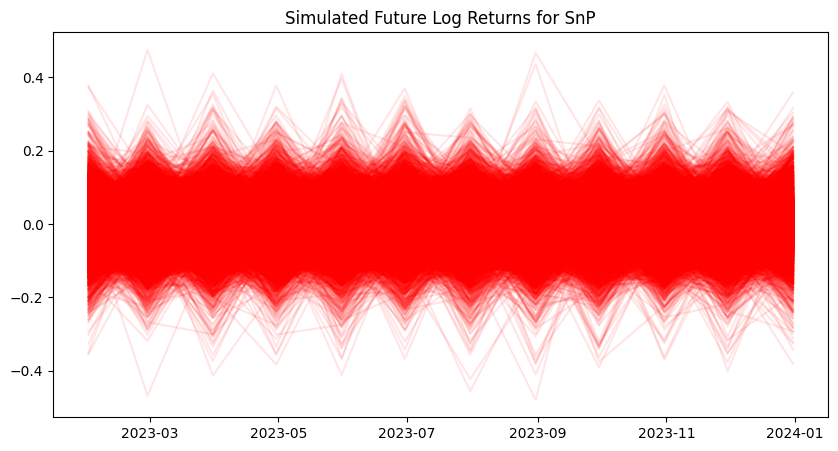

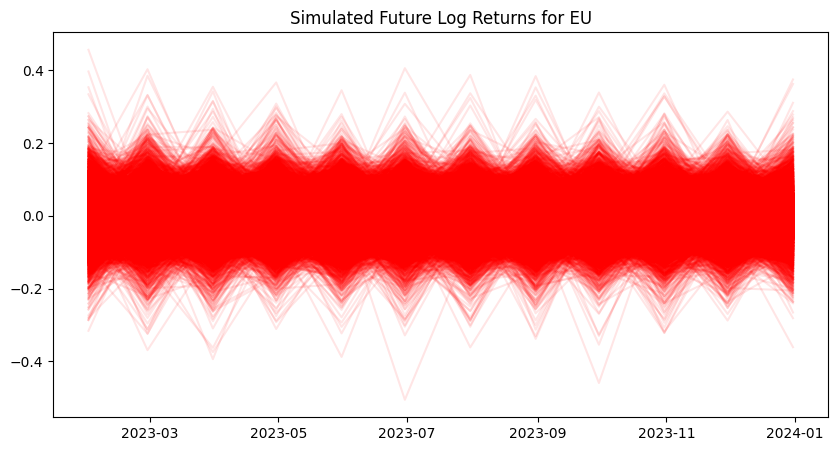

RMSE for SnP: 0.04370459271702422
RMSE for EU: 0.05145258002993183


In [ ]:
# Split data into train and test sets
train_data = df.iloc[:-12]
test_data = df.iloc[-12:]

# Function to fit GARCH model and forecast volatility
def forecast_volatility(returns):
    garch = arch_model(returns, p=1, q=1)
    res = garch.fit(disp='off')
    forecast = res.forecast(horizon=12)
    return np.sqrt(forecast.variance.values[-1])

# Forecasting volatility for SnP and EU
volatility_SnP = forecast_volatility(train_data['Log Return_SnP'].dropna())
volatility_Eu = forecast_volatility(train_data['Log Return_Eu'].dropna())

# Monte Carlo Simulation function
def monte_carlo_simulation(mean, vol, num_simulations=10000):
    # Ensure 'vol' is correctly shaped for broadcasting
    vol = vol.reshape(1, num_periods)  # Adjust if necessary
    # Simulate future log returns using the forecasted volatilities
    simulated_paths = np.random.standard_t(degrees_of_freedom, size=(num_simulations, num_periods)) * vol + mean
    return simulated_paths

# Running simulations
simulated_returns_SnP = monte_carlo_simulation(0, volatility_SnP)
simulated_returns_Eu = monte_carlo_simulation(0, volatility_Eu)

# Plotting function for simulations
def plot_simulations(simulated_returns, title):
    plt.figure(figsize=(10, 5))
    for sim in simulated_returns:
        plt.plot(pd.date_range(start=test_data['Date'].iloc[0], periods=12, freq='M'), sim, alpha=0.1, color='red')
    plt.title(title)
    plt.show()

plot_simulations(simulated_returns_SnP, 'Simulated Future Log Returns for SnP')
plot_simulations(simulated_returns_Eu, 'Simulated Future Log Returns for EU')

# Calculate RMSE to validate the model
def calculate_rmse(actuals, predicted):
    return np.sqrt(mean_squared_error(actuals, predicted.mean(axis=0)))

rmse_SnP = calculate_rmse(test_data['Log Return_SnP'].dropna(), simulated_returns_SnP)
rmse_Eu = calculate_rmse(test_data['Log Return_Eu'].dropna(), simulated_returns_Eu)

print(f"RMSE for SnP: {rmse_SnP}")
print(f"RMSE for EU: {rmse_Eu}")

**Trying to improve RMSE by adjusting the GARCH model settings**

We tried several ways to reduce the RMSE for our final GARCH model, including **adding noise, changing the lags, and adding scale factor**, but the results of RMSE are getting worse.

**Overfitting:** Adding too many lags or parameters might lead to a model that is too complex and overfits the training data. It performs well on the data it was trained on but poorly on out-of-sample data, leading to higher RMSE when validated.

**Noise Addition:** Intentionally adding noise can lead to a higher RMSE due to add additional random variation that the model cannot predict.

In [ ]:
from arch import arch_model

def forecast_volatility(returns, p, q):
    garch = arch_model(returns, p=p, q=q)
    res = garch.fit(disp='off')
    forecast = res.forecast(horizon=12)
    return np.sqrt(forecast.variance.values[-1])


In [ ]:
import scipy.stats as stats

def monte_carlo_simulation(mean, vol, num_simulations, t_degrees=5):
    return stats.t.rvs(df=t_degrees, loc=mean, scale=vol, size=(num_simulations, len(vol)))


In [ ]:
# Adjust the GARCH model settings
volatility_SnP = forecast_volatility(train_data['Log Return_SnP'].dropna(), p=2, q=1)
volatility_Eu = forecast_volatility(train_data['Log Return_Eu'].dropna(), p=2, q=1)

# Using a Student's t-distribution for the Monte Carlo simulation
simulated_returns_SnP = monte_carlo_simulation(0, volatility_SnP, num_simulations=10000, t_degrees=10)
simulated_returns_Eu = monte_carlo_simulation(0, volatility_Eu, num_simulations=10000, t_degrees=10)

# Recalculate RMSE
rmse_SnP = calculate_rmse(test_data['Log Return_SnP'].dropna(), simulated_returns_SnP)
rmse_Eu = calculate_rmse(test_data['Log Return_Eu'].dropna(), simulated_returns_Eu)

print(f"Improved RMSE for SnP: {rmse_SnP}")
print(f"Improved RMSE for EU: {rmse_Eu}")



Improved RMSE for SnP: 0.04386528248367243
Improved RMSE for EU: 0.051430708385274054


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001963. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002593. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




Add Noises

In [ ]:
#add noises
def monte_carlo_simulation(mean, vol, num_simulations=10000, t_degrees=10, noise_scale=0.1):
    # Generate the base simulated paths using Student's t-distribution
    t_random = np.random.standard_t(t_degrees, size=(num_simulations, len(vol)))
    simulated_paths = mean + t_random * vol

    # Add additional Gaussian noise to introduce more variability
    noise = np.random.normal(scale=noise_scale, size=(num_simulations, len(vol)))
    simulated_paths += noise

    return simulated_paths
from sklearn.metrics import mean_squared_error
from math import sqrt

def calculate_rmse(actual_returns, simulated_returns):
    # Calculate the mean of simulated returns across all simulations
    predicted_mean_returns = simulated_returns.mean(axis=0)

    # Calculate RMSE between the mean of simulated returns and the actual returns
    rmse = sqrt(mean_squared_error(actual_returns, predicted_mean_returns))
    return rmse
# Adjust the GARCH model settings
volatility_SnP = forecast_volatility(train_data['Log Return_SnP'].dropna(), p=2, q=1)
volatility_Eu = forecast_volatility(train_data['Log Return_Eu'].dropna(), p=2, q=1)

# Using a Student's t-distribution for the Monte Carlo simulation
simulated_returns_SnP = monte_carlo_simulation(0, volatility_SnP, num_simulations=10000, t_degrees=10)
simulated_returns_Eu = monte_carlo_simulation(0, volatility_Eu, num_simulations=10000, t_degrees=10)

# Recalculate RMSE
rmse_SnP = calculate_rmse(test_data['Log Return_SnP'].dropna(), simulated_returns_SnP)
rmse_Eu = calculate_rmse(test_data['Log Return_Eu'].dropna(), simulated_returns_Eu)

print(f"Improved RMSE for SnP: {rmse_SnP}")
print(f"Improved RMSE for EU: {rmse_Eu}")


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.001963. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




Improved RMSE for SnP: 0.043823151820942756
Improved RMSE for EU: 0.05216529700682396


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning:

y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.002593. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 10 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.




In [ ]:
# Rescale the log returns for better numerical stability
scale_factor = 100
train_data['Log Return_SnP_Scaled'] = train_data['Log Return_SnP'] * scale_factor
train_data['Log Return_Eu_Scaled'] = train_data['Log Return_Eu'] * scale_factor

volatility_SnP = forecast_volatility(train_data['Log Return_SnP_Scaled'].dropna(), p=2, q=1)
volatility_Eu = forecast_volatility(train_data['Log Return_Eu_Scaled'].dropna(), p=2, q=1)

simulated_returns_SnP = monte_carlo_simulation(0, volatility_SnP / scale_factor, num_simulations=10000)
simulated_returns_Eu = monte_carlo_simulation(0, volatility_Eu / scale_factor, num_simulations=10000)

rmse_SnP = calculate_rmse(test_data['Log Return_SnP'].dropna(), simulated_returns_SnP)
rmse_Eu = calculate_rmse(test_data['Log Return_Eu'].dropna(), simulated_returns_Eu)

print(f"Rescaled RMSE for SnP: {rmse_SnP}")
print(f"Rescaled RMSE for EU: {rmse_Eu}")


<ipython-input-63-fa9fc1f94dc4>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-63-fa9fc1f94dc4>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Rescaled RMSE for SnP: 0.04361002024234754
Rescaled RMSE for EU: 0.0523476883307505


# Quantile Regression
 Used when we are more interested in the behavior of the tails of the distribution (like the 5th or 95th percentiles) rather than the mean.

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning:

Maximum number of iterations (1000) reached.



Expanded Quantile Regression Model Summary for SnP:
                         QuantReg Regression Results                          
Dep. Variable:         Log Return_SnP   Pseudo R-squared:               0.3851
Model:                       QuantReg   Bandwidth:                     0.01992
Method:                 Least Squares   Sparsity:                       0.2714
Date:                Wed, 24 Apr 2024   No. Observations:                  529
Time:                        21:59:24   Df Residuals:                      524
                                        Df Model:                            4
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -0.0487      0.005    -10.333      0.000      -0.058      -0.039
Lagged Log Return_SnP              -0.4925      0.075     -6.610      0.000      -0.639      -0

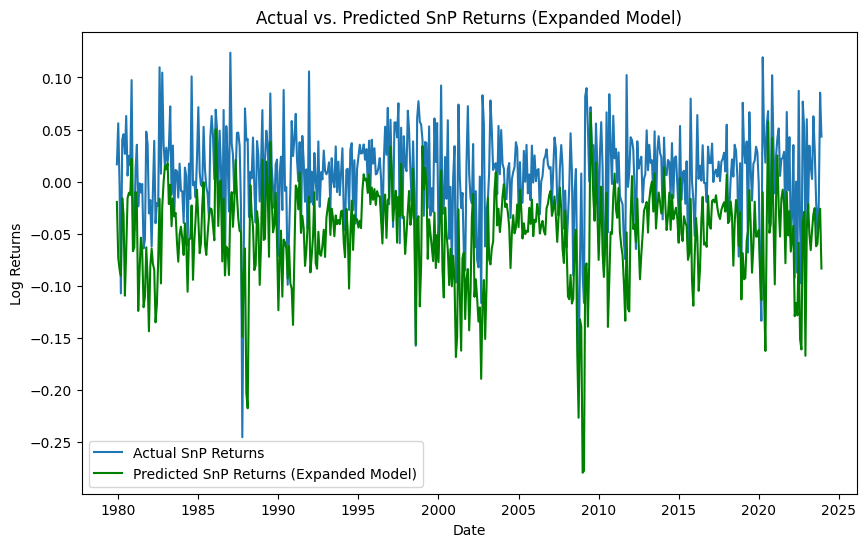

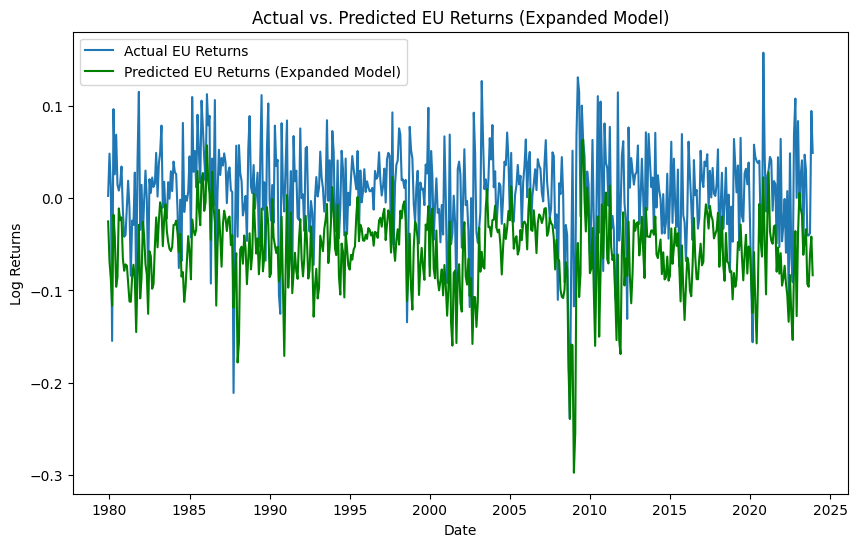

RMSE for Expanded SnP Model: 0.07131162010463336
RMSE for Expanded EU Model: 0.07797408957984721


In [ ]:
import statsmodels.api as sm

# Ensure 'df' is prepared with all necessary columns
df['Lagged Log Return_SnP'] = df['Log Return_SnP'].shift(1)
df['Lagged Log Return_SnP_2'] = df['Log Return_SnP'].shift(2)
df['Rolling Mean Log Return_SnP'] = df['Log Return_SnP'].rolling(window=5).mean()
df['Lagged Volatility Indicator_SnP'] = df['Volatility_Indicator_SnP'].shift(1)

df['Lagged Log Return_Eu'] = df['Log Return_Eu'].shift(1)
df['Lagged Log Return_Eu_2'] = df['Log Return_Eu'].shift(2)
df['Rolling Mean Log Return_Eu'] = df['Log Return_Eu'].rolling(window=5).mean()
df['Lagged Volatility Indicator_Eu'] = df['Volatility_Indicator_Eu'].shift(1)

# Drop any NaNs that result from shifting or rolling functions
df.dropna(inplace=True)

# Expanded predictor set for SnP
X_SnP_expanded = df[['Lagged Log Return_SnP', 'Lagged Log Return_SnP_2', 'Rolling Mean Log Return_SnP', 'Lagged Volatility Indicator_SnP']]
X_SnP_expanded = sm.add_constant(X_SnP_expanded)  # Adds a constant term to the predictor

# Expanded predictor set for EU
X_Eu_expanded = df[['Lagged Log Return_Eu', 'Lagged Log Return_Eu_2', 'Rolling Mean Log Return_Eu', 'Lagged Volatility Indicator_Eu']]
X_Eu_expanded = sm.add_constant(X_Eu_expanded)  # Adds a constant term to the predictor

# Response variables
y_SnP = df['Log Return_SnP']  # SnP log returns
y_Eu = df['Log Return_Eu']  # EU log returns

# Fit the expanded quantile regression model for SnP
quantile = 0.05  # Quantile for analysis
model_SnP_expanded = sm.QuantReg(y_SnP, X_SnP_expanded).fit(q=quantile)
print("Expanded Quantile Regression Model Summary for SnP:")
print(model_SnP_expanded.summary())

# Fit the expanded quantile regression model for EU
model_Eu_expanded = sm.QuantReg(y_Eu, X_Eu_expanded).fit(q=quantile)
print("Expanded Quantile Regression Model Summary for EU:")
print(model_Eu_expanded.summary())

# Plotting the predicted vs. actual values for visualization
predictions_SnP_expanded = model_SnP_expanded.predict(X_SnP_expanded)
predictions_Eu_expanded = model_Eu_expanded.predict(X_Eu_expanded)

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(df['Date'], y_SnP, label='Actual SnP Returns')
plt.plot(df['Date'], predictions_SnP_expanded, label='Predicted SnP Returns (Expanded Model)', color='green')
plt.title('Actual vs. Predicted SnP Returns (Expanded Model)')
plt.xlabel('Date')
plt.ylabel('Log Returns')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(df['Date'], y_Eu, label='Actual EU Returns')
plt.plot(df['Date'], predictions_Eu_expanded, label='Predicted EU Returns (Expanded Model)', color='green')
plt.title('Actual vs. Predicted EU Returns (Expanded Model)')
plt.xlabel('Date')
plt.ylabel('Log Returns')
plt.legend()
plt.show()

# Calculate the RMSE for both models
from sklearn.metrics import mean_squared_error
from math import sqrt

rmse_SnP = sqrt(mean_squared_error(y_SnP, predictions_SnP_expanded))
rmse_Eu = sqrt(mean_squared_error(y_Eu, predictions_Eu_expanded))

print("RMSE for Expanded SnP Model:", rmse_SnP)
print("RMSE for Expanded EU Model:", rmse_Eu)


# Tests and Trials before getting to the above mentioned optimised model

                         QuantReg Regression Results                          
Dep. Variable:         Log Return_SnP   Pseudo R-squared:              0.04242
Model:                       QuantReg   Bandwidth:                     0.02160
Method:                 Least Squares   Sparsity:                       0.5669
Date:                Thu, 25 Apr 2024   No. Observations:                  529
Time:                        16:52:47   Df Residuals:                      527
                                        Df Model:                            1
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.0791      0.005    -14.445      0.000      -0.090      -0.068
Lagged Log Return_SnP     0.4103      0.128      3.214      0.001       0.159       0.661


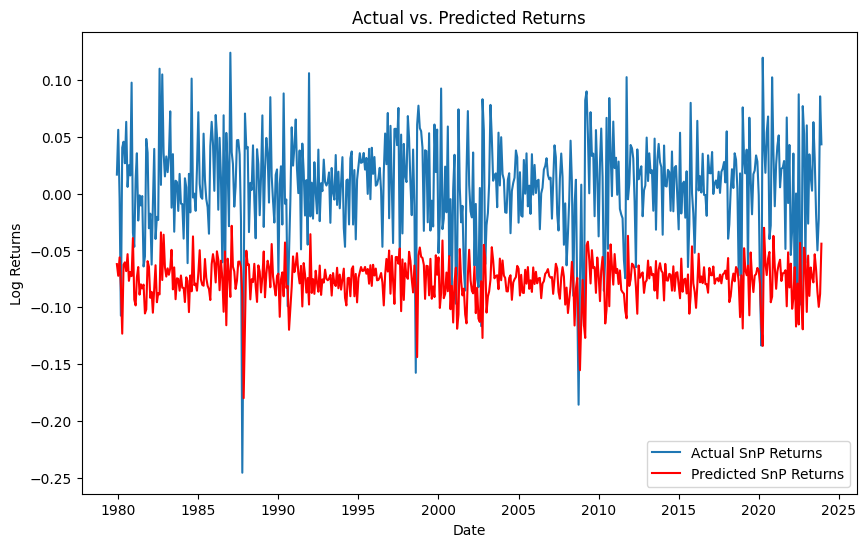

In [ ]:
import statsmodels.api as sm

# Prepare data (here we use lagged returns as a simple predictor)
df['Lagged Log Return_SnP'] = df['Log Return_SnP'].shift(1)
df.dropna(inplace=True)  # Drop missing values that result from lagging

# Define predictors and the target
X = df[['Lagged Log Return_SnP']]  # Predictor
X = sm.add_constant(X)  # Adds a constant term to the predictor
y = df['Log Return_SnP']  # Target variable

# Fit the quantile regression model
quantile = 0.05  # Change this value for different quantiles
model = sm.QuantReg(y, X).fit(q=quantile)

# Summary of the model
print(model.summary())

# Optionally: Plotting the predicted vs actual values for visualization
predictions = model.predict(X)
plt.figure(figsize=(10, 6))
plt.plot(df['Date'], y, label='Actual SnP Returns')
plt.plot(df['Date'], predictions, label='Predicted SnP Returns', color='red')
plt.title('Actual vs. Predicted Returns')
plt.xlabel('Date')
plt.ylabel('Log Returns')
plt.legend()
plt.show()


                         QuantReg Regression Results                          
Dep. Variable:          Log Return_Eu   Pseudo R-squared:              0.05034
Model:                       QuantReg   Bandwidth:                     0.02395
Method:                 Least Squares   Sparsity:                       0.6493
Date:                Thu, 25 Apr 2024   No. Observations:                  528
Time:                        16:52:47   Df Residuals:                      526
                                        Df Model:                            1
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.0880      0.006    -14.017      0.000      -0.100      -0.076
Lagged Log Return_Eu     0.3663      0.143      2.563      0.011       0.086       0.647


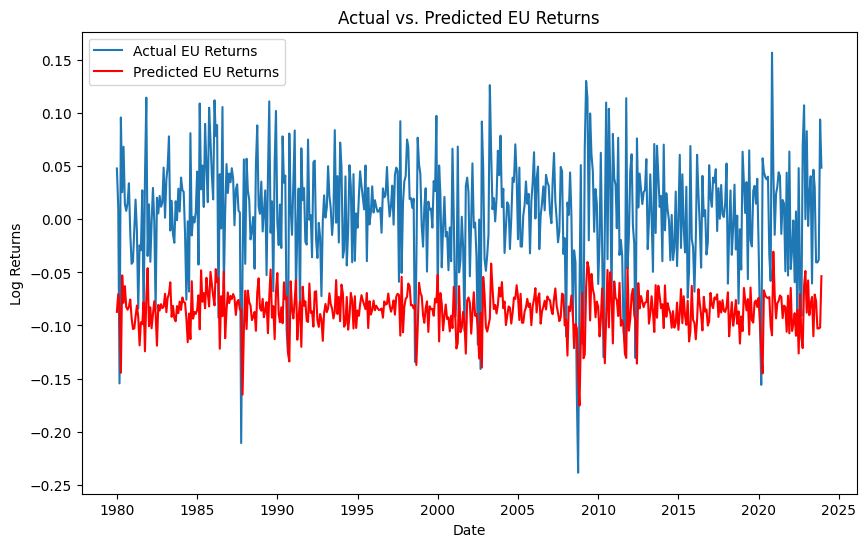

In [ ]:


# Prepare the EU data for quantile regression
df['Lagged Log Return_Eu'] = df['Log Return_Eu'].shift(1)
df.dropna(inplace=True)  # Ensure no NaNs which can result from shifting

# Define predictors and the target for EU data
X_Eu = df[['Lagged Log Return_Eu']]  # Predictor
X_Eu = sm.add_constant(X_Eu)  # Adds a constant term to the predictor
y_Eu = df['Log Return_Eu']  # Target variable

# Fit the quantile regression model for EU
quantile = 0.05  # This is for the 5th percentile; adjust as needed for other quantiles
model_Eu = sm.QuantReg(y_Eu, X_Eu).fit(q=quantile)

# Print model summary
print(model_Eu.summary())

# Plotting the predicted vs actual values for visualization
predictions_Eu = model_Eu.predict(X_Eu)
plt.figure(figsize=(10, 6))
plt.plot(df['Date'], y_Eu, label='Actual EU Returns')
plt.plot(df['Date'], predictions_Eu, label='Predicted EU Returns', color='red')
plt.title('Actual vs. Predicted EU Returns')
plt.xlabel('Date')
plt.ylabel('Log Returns')
plt.legend()
plt.show()


## Expanding Quantile Regression

                         QuantReg Regression Results                          
Dep. Variable:          Log Return_Eu   Pseudo R-squared:               0.3349
Model:                       QuantReg   Bandwidth:                     0.02018
Method:                 Least Squares   Sparsity:                       0.4173
Date:                Thu, 25 Apr 2024   No. Observations:                  524
Time:                        16:52:48   Df Residuals:                      520
                                        Df Model:                            3
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         -0.0678      0.005    -14.827      0.000      -0.077      -0.059
Lagged Log Return_Eu          -0.3187      0.081     -3.924      0.000      -0.478      -0.159
Lagged Log Return_Eu_2        -0.2947      0.091     -3.233      0.

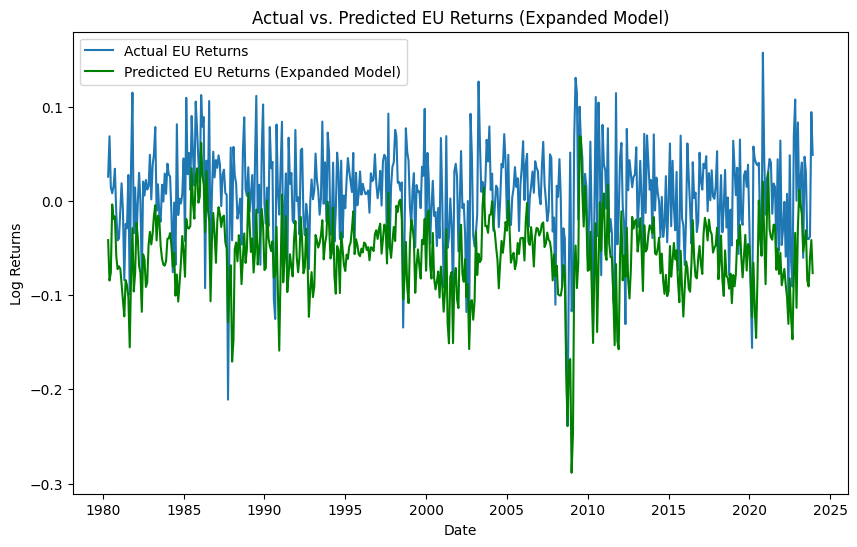

In [ ]:
# Prepare the data with more complex features and reset the index
df['Lagged Log Return_Eu_2'] = df['Log Return_Eu'].shift(2)  # Second lag
df['Rolling Mean Log Return_Eu'] = df['Log Return_Eu'].rolling(window=5).mean()  # 5-day rolling mean
df.dropna(inplace=True)  # Drop any NaNs that result from new feature calculations
df.reset_index(drop=True, inplace=True)  # Reset the index to ensure alignment

# Expanded predictor set
X_Eu_expanded = df[['Lagged Log Return_Eu', 'Lagged Log Return_Eu_2', 'Rolling Mean Log Return_Eu']]
X_Eu_expanded = sm.add_constant(X_Eu_expanded)  # Adds a constant term to the predictor
y_Eu = df['Log Return_Eu']  # Response variable, ensuring it's aligned with X_Eu_expanded

# Fit the expanded model
quantile = 0.05  # Change this value for different quantiles as needed
model_Eu_expanded = sm.QuantReg(y_Eu, X_Eu_expanded).fit(q=quantile)

# Print the expanded model summary
print(model_Eu_expanded.summary())

# Plotting the predicted vs actual values for visualization
predictions_Eu_expanded = model_Eu_expanded.predict(X_Eu_expanded)
plt.figure(figsize=(10, 6))
plt.plot(df['Date'], y_Eu, label='Actual EU Returns')
plt.plot(df['Date'], predictions_Eu_expanded, label='Predicted EU Returns (Expanded Model)', color='green')
plt.title('Actual vs. Predicted EU Returns (Expanded Model)')
plt.xlabel('Date')
plt.ylabel('Log Returns')
plt.legend()
plt.show()

                         QuantReg Regression Results                          
Dep. Variable:         Log Return_SnP   Pseudo R-squared:               0.3535
Model:                       QuantReg   Bandwidth:                     0.01737
Method:                 Least Squares   Sparsity:                       0.2732
Date:                Thu, 25 Apr 2024   No. Observations:                  520
Time:                        16:52:49   Df Residuals:                      516
                                        Df Model:                            3
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                          -0.0587      0.003    -19.565      0.000      -0.065      -0.053
Lagged Log Return_SnP          -0.3592      0.083     -4.320      0.000      -0.523      -0.196
Lagged Log Return_SnP_2        -0.3010      0.067     -4.515   

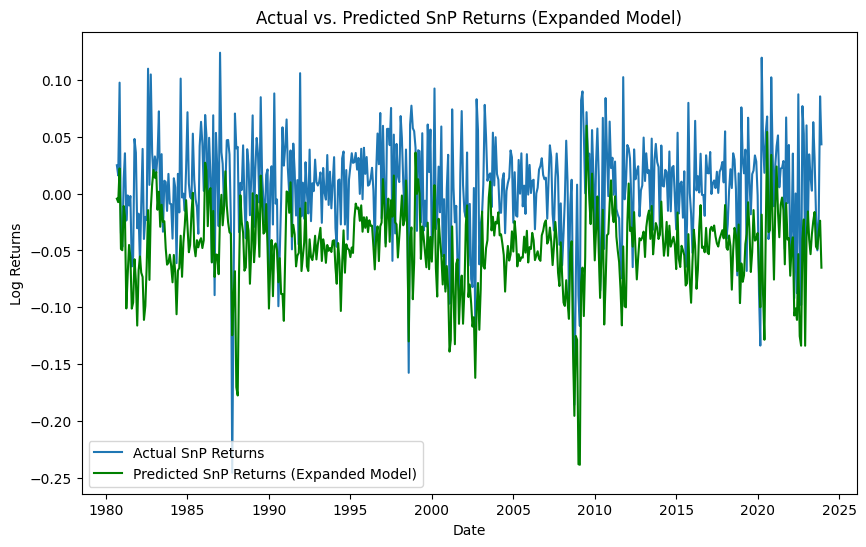

In [ ]:
# Prepare the SnP data with additional complex features and reset the index
df['Lagged Log Return_SnP_2'] = df['Log Return_SnP'].shift(2)  # Second lag
df['Rolling Mean Log Return_SnP'] = df['Log Return_SnP'].rolling(window=5).mean()  # 5-day rolling mean
df.dropna(inplace=True)  # Drop any NaNs that result from new feature calculations
df.reset_index(drop=True, inplace=True)  # Reset the index to ensure alignment

# Expanded predictor set for SnP
X_SnP_expanded = df[['Lagged Log Return_SnP', 'Lagged Log Return_SnP_2', 'Rolling Mean Log Return_SnP']]
X_SnP_expanded = sm.add_constant(X_SnP_expanded)  # Adds a constant term to the predictor
y_SnP = df['Log Return_SnP']  # Response variable, ensuring it's aligned with X_SnP_expanded

# Fit the expanded quantile regression model for SnP
quantile = 0.05  # Adjust this value for different quantiles as needed
model_SnP_expanded = sm.QuantReg(y_SnP, X_SnP_expanded).fit(q=quantile)

# Print the expanded model summary
print(model_SnP_expanded.summary())

# Plotting the predicted vs actual values for visualization
predictions_SnP_expanded = model_SnP_expanded.predict(X_SnP_expanded)
plt.figure(figsize=(10, 6))
plt.plot(df['Date'], y_SnP, label='Actual SnP Returns')
plt.plot(df['Date'], predictions_SnP_expanded, label='Predicted SnP Returns (Expanded Model)', color='green')
plt.title('Actual vs. Predicted SnP Returns (Expanded Model)')
plt.xlabel('Date')
plt.ylabel('Log Returns')
plt.legend()
plt.show()


In [ ]:
# Calculate the RMSE
rmse_Eu = np.sqrt(mean_squared_error(y_Eu, predictions_Eu_expanded))
rmse_SnP = np.sqrt(mean_squared_error(y_SnP, predictions_SnP_expanded))
print("RMSE for Expanded EU Model:", rmse_Eu)
print("RMSE for Expanded SnP Model:", rmse_SnP)


RMSE for Expanded EU Model: 0.07690550227355251
RMSE for Expanded SnP Model: 0.06627213958116907


# Implimenting Deep Learning Model

## LSTM Model

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping

# Filter the data to include up to the end of 2022 for training
cutoff_date = pd.Timestamp('2022-12')
train_data = df[df['Date'] <= cutoff_date]
test_data = df[df['Date'] > cutoff_date]

# Check if there is enough data for testing
if test_data.empty:
    raise ValueError('No data available for testing after the cutoff date.')

# Features to scale include log returns and volatilities
scaler = MinMaxScaler(feature_range=(0, 1))
features = ['Log Return_SnP', 'Log Return_Eu', 'Volatility_SnP', 'Volatility_Eu']
scaled_data = scaler.fit_transform(df[features])

# Function to create sequences with all features included
def create_sequences(data, seq_length):
    xs, ys = [], []
    for i in range(len(data) - seq_length):
        xs.append(data[i:(i + seq_length)])
        ys.append(data[i + seq_length][:2])  # Only predict the log returns, not volatilities
    return np.array(xs), np.array(ys)

sequence_length = 30  # Use 30 lags as found optimal
X, y = create_sequences(scaled_data, sequence_length)

# Split the data into training and testing sets
train_size = int(len(X) * 0.8)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

# Define the LSTM model with dropout for regularization
model = Sequential([
    LSTM(100, return_sequences=True, input_shape=(sequence_length, 4)),  # Input layer for 4 features
    Dropout(0.2),  # Dropout for regularization
    LSTM(50, return_sequences=True),
    Dropout(0.2),
    LSTM(30),
    Dense(2)  # Output layer for predicting two log returns
])

model.compile(optimizer='adam', loss='mean_squared_error')

# Include early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=16, validation_split=0.1, verbose=1, callbacks=[early_stopping])

# Predict on the test set
predicted = model.predict(X_test)
predicted = scaler.inverse_transform(np.concatenate((predicted, np.zeros((predicted.shape[0], 2))), axis=1))[:, :2]  # Inverse scaling
y_test = scaler.inverse_transform(np.concatenate((y_test, np.zeros((y_test.shape[0], 2))), axis=1))[:, :2]

# Calculate RMSE for both SnP and EU predictions
rmse_SnP = np.sqrt(mean_squared_error(y_test[:, 0], predicted[:, 0]))
rmse_Eu = np.sqrt(mean_squared_error(y_test[:, 1], predicted[:, 1]))
print(f'RMSE for SnP predictions: {rmse_SnP}')
print(f'RMSE for EU predictions: {rmse_Eu}')

Epoch 1/100
23/23 [==============================] - 10s 142ms/step - loss: 0.0778 - val_loss: 0.0090
Epoch 2/100
23/23 [==============================] - 1s 50ms/step - loss: 0.0188 - val_loss: 0.0080
Epoch 3/100
23/23 [==============================] - 1s 45ms/step - loss: 0.0170 - val_loss: 0.0081
Epoch 4/100
23/23 [==============================] - 1s 46ms/step - loss: 0.0170 - val_loss: 0.0080
Epoch 5/100
23/23 [==============================] - 1s 47ms/step - loss: 0.0174 - val_loss: 0.0081
Epoch 6/100
23/23 [==============================] - 1s 46ms/step - loss: 0.0172 - val_loss: 0.0081
Epoch 7/100
23/23 [==============================] - 1s 46ms/step - loss: 0.0170 - val_loss: 0.0083
Epoch 8/100
23/23 [==============================] - 1s 47ms/step - loss: 0.0165 - val_loss: 0.0086
Epoch 9/100
23/23 [==============================] - 1s 46ms/step - loss: 0.0167 - val_loss: 0.0084
Epoch 10/100
23/23 [==============================] - 1s 63ms/step - loss: 0.0174 - val_loss: 0.00

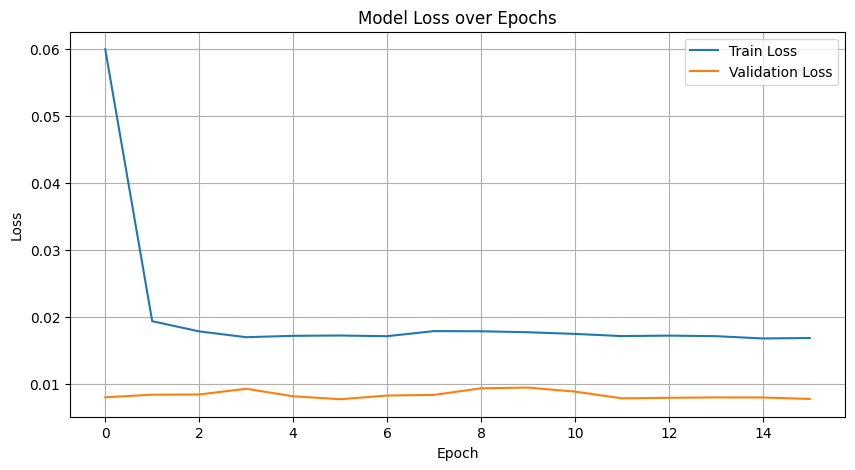

In [ ]:
# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

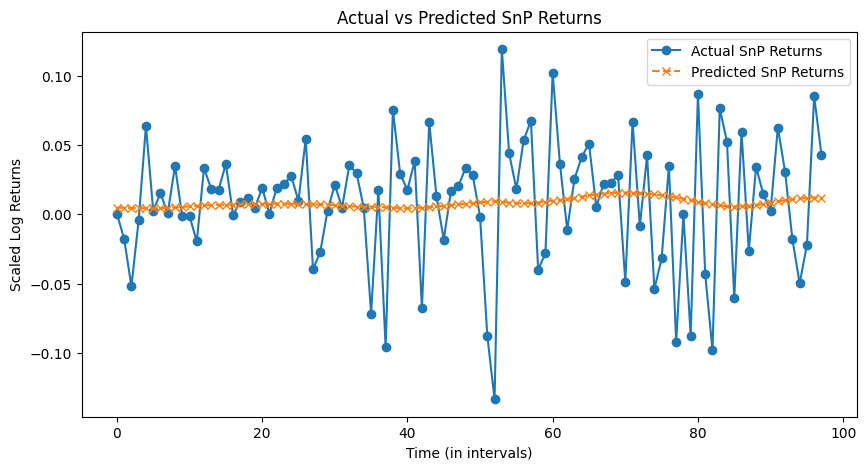

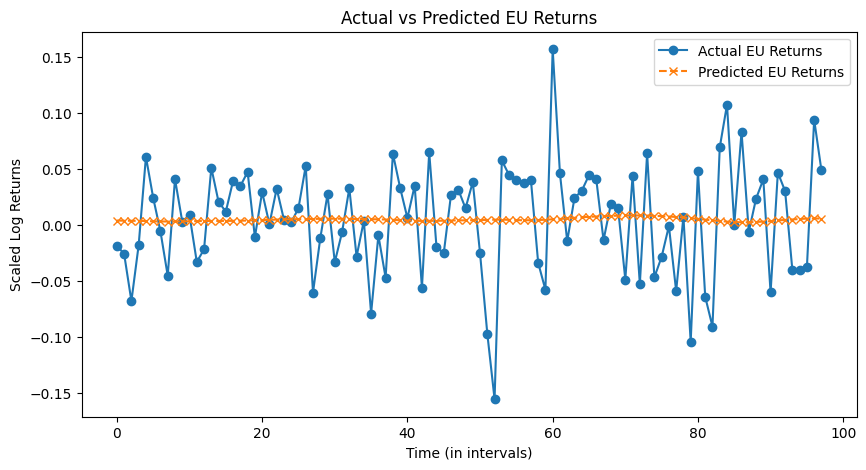

In [ ]:
import matplotlib.pyplot as plt

# Plot for SnP Returns
plt.figure(figsize=(10, 5))
plt.plot(y_test[:, 0], label='Actual SnP Returns', marker='o')
plt.plot(predicted[:, 0], label='Predicted SnP Returns', marker='x', linestyle='--')
plt.title('Actual vs Predicted SnP Returns')
plt.xlabel('Time (in intervals)')
plt.ylabel('Scaled Log Returns')
plt.legend()
plt.show()

# Plot for EU Returns
plt.figure(figsize=(10, 5))
plt.plot(y_test[:, 1], label='Actual EU Returns', marker='o')
plt.plot(predicted[:, 1], label='Predicted EU Returns', marker='x', linestyle='--')
plt.title('Actual vs Predicted EU Returns')
plt.xlabel('Time (in intervals)')
plt.ylabel('Scaled Log Returns')
plt.legend()
plt.show()


# Tests and Trials before getting to the above mentioned optimised model

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.metrics import mean_squared_error
import plotly.graph_objects as go



# Filter the data to include up to the end of 2022 for training
cutoff_date = pd.Timestamp('2022-12')
train_data = df[df['Date'] <= cutoff_date]
test_data = df[df['Date'] > cutoff_date]

# Ensure that we have data to test on
if test_data.empty:
    raise ValueError('No data available for testing after the cutoff date.')

# Scale the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df[['Log Return_SnP', 'Log Return_Eu']])

# Create sequences
sequence_length = 12
def create_sequences(data, seq_length):
    xs, ys = [], []
    for i in range(len(data)-seq_length):
        xs.append(data[i:(i+seq_length)])
        ys.append(data[i+seq_length])
    return np.array(xs), np.array(ys)

X, y = create_sequences(scaled_data, sequence_length)

# Split the data into training and testing sets
train_size = int(len(X) * 0.8)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

# Ensure that we have sequences to test on
if X_test.size == 0:
    raise ValueError('Not enough data to create sequences for testing.')

# Define the LSTM model
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(sequence_length, 2)))
model.add(LSTM(50))
model.add(Dense(2))
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model on the training data
model.fit(X_train, y_train, epochs=20, batch_size=32)

# Predict on the test set
predicted = model.predict(X_test)
predicted = scaler.inverse_transform(predicted)  # Inverse scaling to get actual values
y_test = scaler.inverse_transform(y_test)  # Inverse scaling the test data

# Calculate RMSE for SnP predictions
rmse_SnP = np.sqrt(mean_squared_error(y_test[:, 0], predicted[:, 0]))
print(f'RMSE for SnP predictions: {rmse_SnP}')

# Plot the actual vs predicted values for 2023
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_data['Date'], y=y_test[:, 0], mode='lines', name='Actual SnP Returns'))
fig.add_trace(go.Scatter(x=test_data['Date'], y=predicted[:, 0], mode='lines', name='Predicted SnP Returns'))
fig.update_layout(title='Actual vs Predicted SnP Returns for 2023', xaxis_title='Date', yaxis_title='Log Returns')
fig.show()


Epoch 1/20
13/13 [==============================] - 4s 12ms/step - loss: 0.1494
Epoch 2/20
13/13 [==============================] - 0s 12ms/step - loss: 0.0276
Epoch 3/20
13/13 [==============================] - 0s 12ms/step - loss: 0.0197
Epoch 4/20
13/13 [==============================] - 0s 12ms/step - loss: 0.0169
Epoch 5/20
13/13 [==============================] - 0s 12ms/step - loss: 0.0165
Epoch 6/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0159
Epoch 7/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0160
Epoch 8/20
13/13 [==============================] - 0s 14ms/step - loss: 0.0162
Epoch 9/20
13/13 [==============================] - 0s 12ms/step - loss: 0.0160
Epoch 10/20
13/13 [==============================] - 0s 12ms/step - loss: 0.0159
Epoch 11/20
13/13 [==============================] - 0s 11ms/step - loss: 0.0160
Epoch 12/20
13/13 [==============================] - 0s 12ms/step - loss: 0.0164
Epoch 13/20
13/13 [==================

In [ ]:
# Assuming 'df' is your dataframe after preprocessing
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error
import numpy as np

# Assuming 'X_train', 'y_train', 'X_test', and 'y_test' have been properly defined and prepared

# Define model architecture
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(50))
model.add(Dense(2))  # Output layer for two features

# Compile model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Fit model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.1, verbose=1)

# Predict on test set
predicted = model.predict(X_test)

# Assuming 'scaler' was fit on two features
predicted = scaler.inverse_transform(predicted)
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 2))  # Make sure y_test is reshaped correctly

# Calculate RMSE for both SnP and EU
rmse_SnP = np.sqrt(mean_squared_error(y_test_actual[:, 0], predicted[:, 0]))
rmse_EU = np.sqrt(mean_squared_error(y_test_actual[:, 1], predicted[:, 1]))
print('RMSE for SnP predictions:', rmse_SnP)
print('RMSE for EU predictions:', rmse_EU)


Epoch 1/20
12/12 [==============================] - 5s 84ms/step - loss: 0.1701 - val_loss: 0.0316
Epoch 2/20
12/12 [==============================] - 0s 17ms/step - loss: 0.0306 - val_loss: 0.0181
Epoch 3/20
12/12 [==============================] - 0s 16ms/step - loss: 0.0226 - val_loss: 0.0095
Epoch 4/20
12/12 [==============================] - 0s 15ms/step - loss: 0.0176 - val_loss: 0.0086
Epoch 5/20
12/12 [==============================] - 0s 14ms/step - loss: 0.0177 - val_loss: 0.0085
Epoch 6/20
12/12 [==============================] - 0s 16ms/step - loss: 0.0167 - val_loss: 0.0084
Epoch 7/20
12/12 [==============================] - 0s 15ms/step - loss: 0.0168 - val_loss: 0.0084
Epoch 8/20
12/12 [==============================] - 0s 16ms/step - loss: 0.0169 - val_loss: 0.0085
Epoch 9/20
12/12 [==============================] - 0s 15ms/step - loss: 0.0170 - val_loss: 0.0085
Epoch 10/20
12/12 [==============================] - 0s 15ms/step - loss: 0.0168 - val_loss: 0.0083
Epoch 11/

In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Generate a date range for the predictions if not already available
# This assumes that you have monthly data for 12 months of 2023
prediction_dates = pd.date_range(start='2023-01-01', periods=12, freq='M')

# Create an interactive Plotly graph
fig = go.Figure()

# Add the actual SnP returns
fig.add_trace(go.Scatter(x=prediction_dates, y=y_test_actual[:, 0], mode='lines+markers', name='Actual SnP Returns'))

# Add the predicted SnP returns
fig.add_trace(go.Scatter(x=prediction_dates, y=predicted[:, 0], mode='lines+markers', name='Predicted SnP Returns'))

# Add the actual EU returns
fig.add_trace(go.Scatter(x=prediction_dates, y=y_test_actual[:, 1], mode='lines+markers', name='Actual EU Returns'))

# Add the predicted EU returns
fig.add_trace(go.Scatter(x=prediction_dates, y=predicted[:, 1], mode='lines+markers', name='Predicted EU Returns'))

# Set plot titles and labels
fig.update_layout(
    title='Actual vs Predicted Log Returns for 2023',
    xaxis_title='Date',
    yaxis_title='Log Returns',
    legend_title='Legend'
)

# Show the plot
fig.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import plotly.graph_objects as go

# Calculate log returns from index values
df['Log_Return_SnP'] = np.log(df['IndexVal_SnP'] / df['IndexVal_SnP'].shift(1))
df['Log_Return_Eu'] = np.log(df['IndexVal_Eu'] / df['IndexVal_Eu'].shift(1))
df.dropna(inplace=True)  # Drop NaN values resulting from the log return calculation

# Prepare data for LSTM, scaling the log returns this time
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_log_returns = scaler.fit_transform(df[['Log_Return_SnP', 'Log_Return_Eu']])

def create_sequences(data, n_lookback):
    X, y = [], []
    for i in range(n_lookback, len(data)):
        X.append(data[i - n_lookback:i])
        y.append(data[i])
    return np.array(X), np.array(y)

n_lookback = 12  # Number of months to use for prediction
X, y = create_sequences(scaled_log_returns, n_lookback)

# Split into train and test sets
train_size = int(len(X) * 0.8)  # Use 80% of data for training, adjust as necessary
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

# LSTM model
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(n_lookback, 2)))  # 2 features for SnP and EU
model.add(LSTM(50))
model.add(Dense(2))  # Predicting both SnP and EU log returns
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=1)

# Predict log returns
predicted_log_returns = model.predict(X_test)
predicted_log_returns = scaler.inverse_transform(predicted_log_returns)
actual_log_returns = scaler.inverse_transform(y_test)

# Calculate RMSE for log return predictions
rmse_log_snp = np.sqrt(mean_squared_error(actual_log_returns[:, 0], predicted_log_returns[:, 0]))
rmse_log_eu = np.sqrt(mean_squared_error(actual_log_returns[:, 1], predicted_log_returns[:, 1]))
print(f'RMSE for SnP log return predictions: {rmse_log_snp}')
print(f'RMSE for EU log return predictions: {rmse_log_eu}')

# Visualize the predictions vs actual log returns
dates_test = pd.date_range(start=df.iloc[train_size + n_lookback]['Date'], periods=len(X_test), freq='M').strftime('%Y-%m')
fig_log_returns = go.Figure()
fig_log_returns.add_trace(go.Scatter(x=dates_test, y=actual_log_returns[:, 0], mode='lines', name='Actual SnP Log Returns'))
fig_log_returns.add_trace(go.Scatter(x=dates_test, y=predicted_log_returns[:, 0], mode='lines', name='Predicted SnP Log Returns'))
fig_log_returns.add_trace(go.Scatter(x=dates_test, y=actual_log_returns[:, 1], mode='lines', name='Actual EU Log Returns'))
fig_log_returns.add_trace(go.Scatter(x=dates_test, y=predicted_log_returns[:, 1], mode='lines', name='Predicted EU Log Returns'))
fig_log_returns.update_layout(title='Actual vs Predicted Log Returns', xaxis_title='Date', yaxis_title='Log Returns')
fig_log_returns.show()


Epoch 1/100
13/13 [==============================] - 5s 80ms/step - loss: 0.1413 - val_loss: 0.0571
Epoch 2/100
13/13 [==============================] - 0s 17ms/step - loss: 0.0273 - val_loss: 0.0279
Epoch 3/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0196 - val_loss: 0.0196
Epoch 4/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0164 - val_loss: 0.0183
Epoch 5/100
13/13 [==============================] - 0s 16ms/step - loss: 0.0165 - val_loss: 0.0172
Epoch 6/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0159 - val_loss: 0.0166
Epoch 7/100
13/13 [==============================] - 0s 16ms/step - loss: 0.0161 - val_loss: 0.0163
Epoch 8/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0159 - val_loss: 0.0165
Epoch 9/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0160 - val_loss: 0.0163
Epoch 10/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0160 - val_loss: 0.0165

In [ ]:
# Filter the data to include up to the end of 2022 for training
cutoff_date = pd.Timestamp('2022-12')
train_data = df[df['Date'] <= cutoff_date]
test_data = df[df['Date'] > cutoff_date]

if test_data.empty:
    raise ValueError('No data available for testing after the cutoff date.')

# Scale the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df[['Log Return_SnP', 'Log Return_Eu']])

# Define a new sequence length for more historical lags
sequence_length = 24  # Increased to include more historical data

def create_sequences(data, seq_length):
    xs, ys = [], []
    for i in range(len(data) - seq_length):
        xs.append(data[i:(i + seq_length)])
        ys.append(data[i + seq_length])
    return np.array(xs), np.array(ys)

X, y = create_sequences(scaled_data, sequence_length)

# Split the data into training and testing sets
train_size = int(len(X) * 0.8)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

# Define the LSTM model with adjusted input shape
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(sequence_length, 2)))  # 2 features for SnP and EU
model.add(LSTM(50))  # Additional LSTM layer for complexity
model.add(Dense(2))  # Output layer for predicting both SnP and EU log returns
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model on the training data
model.fit(X_train, y_train, epochs=20, batch_size=32)

# Predict on the test set
predicted = model.predict(X_test)
predicted = scaler.inverse_transform(predicted)  # Inverse scaling to get actual values
y_test = scaler.inverse_transform(y_test)  # Inverse scaling the test data

# Calculate RMSE for both SnP and EU predictions
rmse_SnP = np.sqrt(mean_squared_error(y_test[:, 0], predicted[:, 0]))
rmse_Eu = np.sqrt(mean_squared_error(y_test[:, 1], predicted[:, 1]))
print(f'RMSE for SnP predictions: {rmse_SnP}')
print(f'RMSE for EU predictions: {rmse_Eu}')

# Plot the actual vs predicted values for both SnP and EU
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_data['Date'], y=y_test[:, 0], mode='lines', name='Actual SnP Returns'))
fig.add_trace(go.Scatter(x=test_data['Date'], y=predicted[:, 0], mode='lines', name='Predicted SnP Returns'))
fig.add_trace(go.Scatter(x=test_data['Date'], y=y_test[:, 1], mode='lines', name='Actual EU Returns'))
fig.add_trace(go.Scatter(x=test_data['Date'], y=predicted[:, 1], mode='lines', name='Predicted EU Returns'))
fig.update_layout(title='Actual vs Predicted Returns for SnP and EU', xaxis_title='Date', yaxis_title='Log Returns')
fig.show()

Epoch 1/20
13/13 [==============================] - 4s 32ms/step - loss: 0.1757
Epoch 2/20
13/13 [==============================] - 0s 32ms/step - loss: 0.0294
Epoch 3/20
13/13 [==============================] - 0s 32ms/step - loss: 0.0178
Epoch 4/20
13/13 [==============================] - 0s 34ms/step - loss: 0.0160
Epoch 5/20
13/13 [==============================] - 0s 33ms/step - loss: 0.0165
Epoch 6/20
13/13 [==============================] - 0s 23ms/step - loss: 0.0158
Epoch 7/20
13/13 [==============================] - 0s 21ms/step - loss: 0.0157
Epoch 8/20
13/13 [==============================] - 0s 21ms/step - loss: 0.0162
Epoch 9/20
13/13 [==============================] - 0s 21ms/step - loss: 0.0158
Epoch 10/20
13/13 [==============================] - 0s 21ms/step - loss: 0.0160
Epoch 11/20
13/13 [==============================] - 0s 22ms/step - loss: 0.0158
Epoch 12/20
13/13 [==============================] - 0s 22ms/step - loss: 0.0161
Epoch 13/20
13/13 [==================

4/4 [==============================] - 0s 3ms/step
Lag: 1 - RMSE: 0.14834940664690574
4/4 [==============================] - 1s 5ms/step
Lag: 2 - RMSE: 0.14354048487721177
4/4 [==============================] - 0s 3ms/step
Lag: 3 - RMSE: 0.13805356611916253
4/4 [==============================] - 0s 3ms/step
Lag: 4 - RMSE: 0.1351987368986559
4/4 [==============================] - 0s 4ms/step
Lag: 5 - RMSE: 0.13156166310245535
4/4 [==============================] - 0s 4ms/step
Lag: 6 - RMSE: 0.13114649380907523
4/4 [==============================] - 0s 4ms/step
Lag: 7 - RMSE: 0.12948833067577367
4/4 [==============================] - 0s 4ms/step
Lag: 8 - RMSE: 0.1294227921936867
4/4 [==============================] - 1s 5ms/step
Lag: 9 - RMSE: 0.1292870218101549
4/4 [==============================] - 0s 4ms/step
Lag: 10 - RMSE: 0.13020716702441723
4/4 [==============================] - 0s 6ms/step
Lag: 11 - RMSE: 0.13005742966735628
4/4 [==============================] - 0s 4ms/step
Lag:

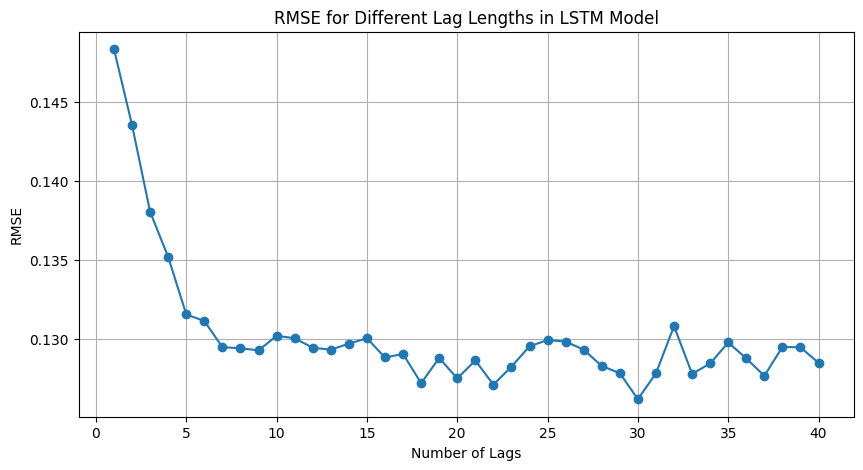

In [ ]:
#EDA to determine the number of lags appropriate for this model
# Function to create a dataset with specified lags
def create_dataset(data, n_lags):
    X, y = [], []
    for i in range(n_lags, len(data)):
        X.append(data[i-n_lags:i])
        y.append(data[i])
    return np.array(X), np.array(y)

# Define a range of lags to test
lags = range(1, 41)  # Test up to 40 lags
results = {}

for n_lags in lags:
    scaled_data = MinMaxScaler(feature_range=(0, 1)).fit_transform(df[['Log Return_SnP', 'Log Return_Eu']])
    X, y = create_dataset(scaled_data, n_lags)

    # Split the dataset (80% training, 20% testing)
    train_size = int(len(X) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Build the LSTM model
    model = Sequential([
        LSTM(50, input_shape=(n_lags, 2)),
        Dense(2)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train and evaluate the model
    model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=0)
    predictions = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    results[n_lags] = rmse
    print(f'Lag: {n_lags} - RMSE: {rmse}')

# Plotting RMSE for different lags
plt.figure(figsize=(10, 5))
plt.plot(list(results.keys()), list(results.values()), marker='o')
plt.xlabel('Number of Lags')
plt.ylabel('RMSE')
plt.title('RMSE for Different Lag Lengths in LSTM Model')
plt.grid(True)
plt.show()


30 lags is bringing in the least RMSE value, with the range decreasing significantly from 20 lags

In [ ]:
# Calculate rolling standard deviation of log returns (volatility)
window_size = 10  # Define the window size for calculating volatility
df1['Volatility_SnP'] = df1['Log Return_SnP'].rolling(window=window_size).std()
df1['Volatility_Eu'] = df1['Log Return_Eu'].rolling(window=window_size).std()

# Drop NaN values created by rolling function and log return calculation
df1.dropna(inplace=True)

# Scaling features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_features = scaler.fit_transform(df1[['Log Return_SnP', 'Log Return_Eu', 'Volatility_SnP', 'Volatility_Eu']])
scaled_df = pd.DataFrame(scaled_features, columns=['Scaled Log Return_SnP', 'Scaled Log Return_Eu', 'Scaled Volatility_SnP', 'Scaled Volatility_Eu'])

# Helper function to create dataset with specified lags
def create_dataset(data, n_lags):
    X, y = [], []
    for i in range(n_lags, len(data)):
        X.append(data[i - n_lags:i])
        y.append(data[i, :2])  # Target is the scaled log returns for both SnP and Eu
    return np.array(X), np.array(y)

# Creating the dataset with 32 lags
X, y = create_dataset(scaled_df.values, 32)

# Split the dataset
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

In [ ]:
# Define LTSM model
model = Sequential([
    LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True),
    LSTM(30),
    Dense(2)  # Output layer for the two log returns
])

model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.1, verbose=1)

# Predict on the test set
predicted = model.predict(X_test)
test_rmse = np.sqrt(mean_squared_error(y_test, predicted))
print(f'Test RMSE: {test_rmse}')


Epoch 1/50
12/12 [==============================] - 5s 101ms/step - loss: 0.0809 - val_loss: 0.0147
Epoch 2/50
12/12 [==============================] - 0s 28ms/step - loss: 0.0221 - val_loss: 0.0128
Epoch 3/50
12/12 [==============================] - 0s 29ms/step - loss: 0.0177 - val_loss: 0.0094
Epoch 4/50
12/12 [==============================] - 0s 29ms/step - loss: 0.0170 - val_loss: 0.0098
Epoch 5/50
12/12 [==============================] - 0s 28ms/step - loss: 0.0167 - val_loss: 0.0088
Epoch 6/50
12/12 [==============================] - 0s 30ms/step - loss: 0.0166 - val_loss: 0.0089
Epoch 7/50
12/12 [==============================] - 0s 30ms/step - loss: 0.0164 - val_loss: 0.0094
Epoch 8/50
12/12 [==============================] - 0s 29ms/step - loss: 0.0166 - val_loss: 0.0088
Epoch 9/50
12/12 [==============================] - 0s 31ms/step - loss: 0.0166 - val_loss: 0.0088
Epoch 10/50
12/12 [==============================] - 0s 29ms/step - loss: 0.0164 - val_loss: 0.0088
Epoch 11

4/4 [==============================] - 1s 9ms/step
Test RMSE: 0.12541438179862016


Increasing the number of layers, adding a drpout layer

In [ ]:
from keras.layers import Dropout

# Define an enhanced LSTM model
model = Sequential([
    LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True),
    Dropout(0.2),  # Dropout for regularization
    LSTM(50, return_sequences=True),
    Dropout(0.2),  # Another dropout layer for regularization
    LSTM(30),
    Dense(2)  # Output layer for the two log returns
])

model.compile(optimizer='adam', loss='mean_squared_error')

# Include early stopping
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=16,  # Smaller batch size and more epochs
                    validation_split=0.1, verbose=1, callbacks=[early_stopping])

# Predict on the test set
predicted = model.predict(X_test)
test_rmse = np.sqrt(mean_squared_error(y_test, predicted))
print(f'Test RMSE: {test_rmse}')


Epoch 1/100
23/23 [==============================] - 8s 95ms/step - loss: 0.0797 - val_loss: 0.0094
Epoch 2/100
23/23 [==============================] - 1s 40ms/step - loss: 0.0199 - val_loss: 0.0098
Epoch 3/100
23/23 [==============================] - 1s 43ms/step - loss: 0.0172 - val_loss: 0.0096
Epoch 4/100
23/23 [==============================] - 1s 42ms/step - loss: 0.0172 - val_loss: 0.0095
Epoch 5/100
23/23 [==============================] - 1s 41ms/step - loss: 0.0175 - val_loss: 0.0091
Epoch 6/100
23/23 [==============================] - 1s 41ms/step - loss: 0.0170 - val_loss: 0.0105
Epoch 7/100
23/23 [==============================] - 1s 64ms/step - loss: 0.0171 - val_loss: 0.0089
Epoch 8/100
23/23 [==============================] - 2s 70ms/step - loss: 0.0165 - val_loss: 0.0106
Epoch 9/100
23/23 [==============================] - 1s 43ms/step - loss: 0.0193 - val_loss: 0.0099
Epoch 10/100
23/23 [==============================] - 1s 42ms/step - loss: 0.0174 - val_loss: 0.0107

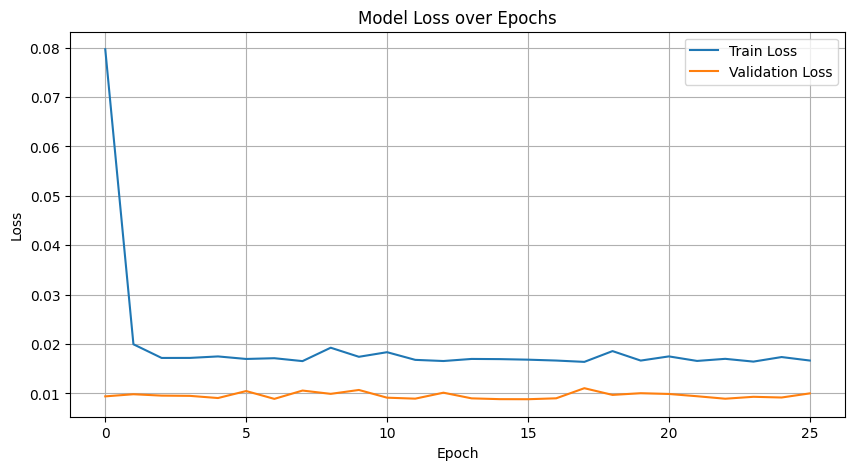

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


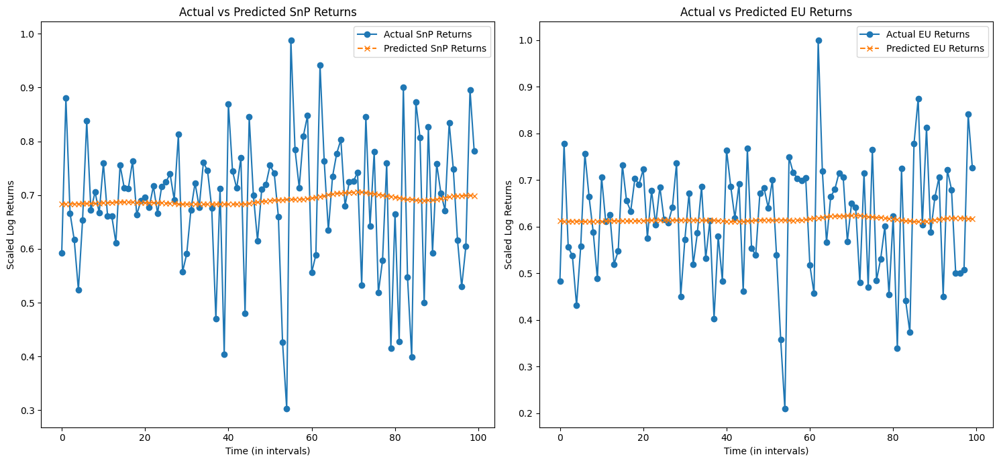

In [ ]:
# Assuming y_test and predicted are already defined as your actual and model's predictions
# Plotting actual vs predicted values for SnP and EU indices
plt.figure(figsize=(15, 7))

# Actual vs. Predicted for SnP
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
plt.plot(y_test[:, 0], label='Actual SnP Returns', marker='o')
plt.plot(predicted[:, 0], label='Predicted SnP Returns', marker='x', linestyle='--')
plt.title('Actual vs Predicted SnP Returns')
plt.xlabel('Time (in intervals)')
plt.ylabel('Scaled Log Returns')
plt.legend()

# Actual vs. Predicted for EU
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
plt.plot(y_test[:, 1], label='Actual EU Returns', marker='o')
plt.plot(predicted[:, 1], label='Predicted EU Returns', marker='x', linestyle='--')
plt.title('Actual vs Predicted EU Returns')
plt.xlabel('Time (in intervals)')
plt.ylabel('Scaled Log Returns')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# Assuming X_test has the most recent data points and your sequence length is consistent with X_train.shape[1]
last_sequence = X_test[-1:]  # Take the last sequence from your test set


In [ ]:
predictions = []
current_sequence = last_sequence.copy()  # Ensure you're working with a copy to not alter original data

for _ in range(12):  # Predict the next 12 periods
    next_prediction = model.predict(current_sequence)  # Predict the next step
    predictions.append(next_prediction[0])  # Store the prediction

    # Roll the sequence to remove the oldest step
    current_sequence = np.roll(current_sequence, -1, axis=1)

    # Update the sequence with new predictions - adjust indices according to your feature setup
    # Assuming your predicted features are the first two and the rest need to be carried over
    current_sequence[0, -1, :2] = next_prediction  # Update predicted features
    current_sequence[0, -1, 2:] = current_sequence[0, -2, 2:]  # Carry forward other features if necessary


1/1 [==============================] - 0s 27ms/step


In [ ]:
# Fit the scaler to just the predicted features initially
scaler = MinMaxScaler(feature_range=(0, 1))
scaler.fit(df[['Log Return_SnP', 'Log Return_Eu']])  # Assuming these are the features being predicted

# Then use this scaler to scale and inverse scale predictions
scaled_data = scaler.transform(df[['Log Return_SnP', 'Log Return_Eu']])
# Predictions part remains the same
